# Outcomes Analysis

# Load in libraries

In [2]:
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from itertools import combinations
from collections import defaultdict
from scipy.stats import kruskal, mannwhitneyu
from statsmodels.stats.multitest import multipletests

/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Create dictionaries, file paths and desired columns of data fields

In [3]:
data_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/Data/Raw_data/PUF AY %i/CSV/'
years = range(2017, 2023)
thoracotomy_codes = ['0WJB0ZZ', '0WJ90ZZ', '02JA0ZZ', '02JY0ZZ', '0BJL0ZZ', '0BJK0ZZ', '0BJQ0ZZ','0WJ80ZZ', '0WJC0ZZ', '0WJD0ZZ', '02VW0CZ', '02QA0ZZ', '3E080GC']
sternotomy_codes = ['0P800ZZ']

mechanism_code_dict = {1:'Cut/pierce', 2:'Drowning/submersion', 3:'Fall', 4:'Fire/flame', 5:'Hot object/substance', 6:'Firearm', 7:'Machinery', 8:'MVT Occupant', 9:'MVT Motorcyclist', 10:'MVT Pedal cyclist', 11:'MVT Pedestrian', 12:'MVT Unspecified', 13:'MVT Other', 14:'Pedal cyclist, other', 15:'Pedestrian, other', 16:'Transport, other', 17:'Natural/environmental,  Bites and stings', 18:'Natural/environmental,  Other', 19:'Overexertion', 20:'Poisoning', 21:'Struck by, against', 22:'Suffocation', 23:'Other specified and classifiable', 24:'Other specified, not elsewhere classifiable', 25:'Unspecified', 26:'Adverse effects, medical care', 27:'Adverse effects, drugs'} # As noted in PUF dictionary
trauma_type_code_dict = {1:'Blunt', 2:'Penetrating', 3:'Burn', 4:'Other/unspecified', 9:'Activity Code - Not Valid as a Primary E-Code'} # As noted in PUF Dictionary
sex_code_dict = {1:'Male', 2:'Female', 3:'Unknown'}
eddischarge_code_dict = {1: 'Floor bed (general admission, non-specialty unit bed)', 2: 'Observation unit (unit that provides < 24 hour stays)', 3: 'Telemetry/step-down unit (less acuity than ICU)', 4: 'Home with services', 5: 'Deceased/expired', 6: 'Other (jail, institutional care, mental health, etc.)', 7: 'Operating Room', 8: 'Intensive Care Unit (ICU)', 9: 'Home without services', 10: 'Left against medical advice', 11: 'Transferred to another hospital'}
hospdischarge_disposition_code_dict = {1: 'Discharged/Transferred to a short-term general hospital for inpatient care', 2: 'Discharged/Transferred to an Intermediate Care Facility (ICF)', 3: 'Discharged/Transferred to home under care of organized home health service', 4: 'Left against medical advice or discontinued care', 5: 'Deceased/Expired', 6: 'Discharged to home or self-care (routine discharge)', 7: 'Discharged/Transferred to Skilled Nursing Facility (SNF)', 8: 'Discharged/Transferred to hospice care', 10: 'Discharged/Transferred to court/law enforcement', 11: 'Discharged/Transferred to inpatient rehab or designated unit', 12: 'Discharged/Transferred to Long Term Care Hospital (LTCH)', 13: 'Discharged/Transferred to a psychiatric hospital or psychiatric distinct part unit of a hospital', 14: 'Discharged/Transferred to another type of institution not defined elsewhere'}
deathined_code_dict = {1:'Arrived with NO signs of life', 2:'Arrived with signs of life'}
prehospca_code_dict = {1:'Yes', 2:'No'}
transport_mode_code_dict = {1:'Ground Ambulance', 2:'Helicopter Ambulance', 3:'Fixed-wing Ambulance', 4:'Private/Public Vehicle/Walk-in', 5:'Police', 6:'Other'}
hosptype_dict = {1:'For Profit', 2:'Non-Profit', 3:'Government'}
verification_lvl_dict = {1:'Level 1 Traum Center', 2:'Level 2 Trauma Center', 3:'Level 3 Trauma Center'}
peds_verification_lvl_dict = {1:'Level 1 Pediatric Traum Center', 2:'Level 2 Pediatric Trauma Center'}
state_des_dict = {1:'Level 1 Trauma Center', 2:'Level 2 Trauma Center', 3:'Level 3 Trauma Center', 4:'Level 4 Trauma Center', 6:'Other', 7:'Not applicable'}
peds_state_des_dict = {1:'Level 1 Trauma Center', 2:'Level 2 Trauma Center', 3:'Level 3 Trauma Center', 4:'Level 4 Trauma Center', 6:'Other', 7:'Not applicable'}
bedsize_dict = {1:'<= 200', 2:'201-400', 3:'401-600', 4:'> 600'}

cols17 = pd.read_csv(data_fp%(2017)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols19 = pd.read_csv(data_fp%(2017)+'PUF_TRAUMA.csv', nrows=1).columns.tolist()
cols17 = [x.upper() for x in cols17]
cols19 = [x.upper() for x in cols19]

common_cols = list(set(cols17) & set(cols19))

# Data Exploration of Thoracotomy Data Outcomes

## Combine years of data into one `DataFrame` for figure generation

In [4]:
TRAUMA_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newTRAUMA_df_%i.csv'
ICDPROCEDURE_fp = '/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/newICDPROCEDURE_df_%i.csv'

years = range(2017, 2023)

# Preload column names
TRAUMA_cols = pd.read_csv(TRAUMA_fp % 2017, nrows=1).columns.tolist()
ICDPROCEDURE_cols = pd.read_csv(ICDPROCEDURE_fp % 2017, nrows=1).columns.tolist()

# Collect DataFrames in lists
trauma_dfs = []
icdprocedure_dfs = []

for year in years:
    trauma_df = pd.read_csv(TRAUMA_fp % year)
    trauma_df['Year'] = year
    icdprocedure_df = pd.read_csv(ICDPROCEDURE_fp % year)
    icdprocedure_df['Year'] = year
    trauma_dfs.append(trauma_df)
    icdprocedure_dfs.append(icdprocedure_df)

# Concatenate DataFrames once at the end
TRAUMA_all_df = pd.concat(trauma_dfs, ignore_index=True)
ICDPROCEDURE_all_df = pd.concat(icdprocedure_dfs, ignore_index=True)

TRAUMA_all_df['SEX'] = TRAUMA_all_df['SEX'].replace({'3.0': 'Unknown', 'Not Known BIU 2': 'Unknown', 'Not Known/Not Recorded BIU 2': 'Unknown', 'Unknown': 'Unknown'})
TRAUMA_all_df['DEATHINED'] = TRAUMA_all_df['DEATHINED'].replace(deathined_code_dict)
TRAUMA_all_df['TRANSPORTMODE'] = TRAUMA_all_df['TRANSPORTMODE'].replace(transport_mode_code_dict)
TRAUMA_all_df['VERIFICATIONLEVEL'] = TRAUMA_all_df['VERIFICATIONLEVEL'].replace(verification_lvl_dict)
TRAUMA_all_df['PEDIATRICVERIFICATIONLEVEL'] = TRAUMA_all_df['PEDIATRICVERIFICATIONLEVEL'].replace(peds_verification_lvl_dict)
TRAUMA_all_df['STATEDESIGNATION'] = TRAUMA_all_df['STATEDESIGNATION'].replace(state_des_dict)
TRAUMA_all_df['HOSPITALTYPE'] = TRAUMA_all_df['HOSPITALTYPE'].replace(hosptype_dict)
TRAUMA_all_df['BEDSIZE'] = TRAUMA_all_df['BEDSIZE'].replace(bedsize_dict)
TRAUMA_all_df['STATEPEDIATRICDESIGNATION'] = TRAUMA_all_df['STATEPEDIATRICDESIGNATION'].replace(peds_state_des_dict)
TRAUMA_all_df['PREHOSPITALCARDIACARREST'] = TRAUMA_all_df['PREHOSPITALCARDIACARREST'].replace(prehospca_code_dict)
TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['HMRRHGCTRLSURGMINS'])
TRAUMA_all_df = TRAUMA_all_df.dropna(subset=['AGEYEARS'])
TRAUMA_all_df['HMRRHGCTRLSURGMINS'] = TRAUMA_all_df['HMRRHGCTRLSURGMINS'].round().astype(int)
TRAUMA_all_df = TRAUMA_all_df.loc[(TRAUMA_all_df['HMRRHGCTRLSURGMINS'] <= 20) & (TRAUMA_all_df['HMRRHGCTRLSURGDAYS'] <= 1.0)]
ICDPROCEDURE_all_df = ICDPROCEDURE_all_df.loc[ICDPROCEDURE_all_df['INC_KEY'].isin(np.unique(TRAUMA_all_df['INC_KEY']))]

# Filter the DataFrame
TRAUMA_all_df = TRAUMA_all_df[TRAUMA_all_df['HMRRHGCTRLSURGMINS'] < TRAUMA_all_df['EDMINS']]

TRAUMA_all_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/TRAUMA_all_df_HMRRHGCTRLSURG.csv', index=False)
ICDPROCEDURE_all_df.to_csv('/Users/JakeCanfield/Documents/Trauma_Surgery_Research/data/Combined_data/ICDPROCEDURE_all_df_HMRRHGCTRLSURG.csv', index=False)

# Display results
display(TRAUMA_all_df.tail())
print(np.shape(TRAUMA_all_df))
display(ICDPROCEDURE_all_df.tail())
print(np.shape(ICDPROCEDURE_all_df))
print(len(np.unique(TRAUMA_all_df['INC_KEY'])))

# Free up memory
del trauma_dfs, icdprocedure_dfs

,INC_KEY,SEX,SEX_BIU,AGEYEARS,ASIAN,PACIFICISLANDER,RACEOTHER,AMERICANINDIAN,BLACK,WHITE,...,ISSVERSION,TRAUMASURGEONARRIVALHRS,TRAUMASURGEONARRIVALDAYS,TRAUMASURGEONARRIVALDH_BIU,HIGHESTACTIVATION,HIGHESTACTIVATION_BIU,HOMERESIDENCE_HOMELESS,HOMERESIDENCE_UK,HOMERESIDENCE_NA,HOMERESIDENCE_OTHER
17585,220072330117,Male,NaN,21.0,0,0,0,0,1,0,...,AIS 2005,0.0,1.0,NaN,1.0,NaN,0.0,0.0,1.0,0.0
17587,220072330188,Male,NaN,39.0,0,0,0,0,1,0,...,AIS 2005,0.0,1.0,NaN,1.0,NaN,0.0,0.0,1.0,0.0
17588,220072330312,Male,NaN,55.0,0,0,0,0,1,0,...,AIS 2005,0.0,1.0,NaN,1.0,NaN,0.0,0.0,1.0,0.0
17589,220072330323,Male,NaN,41.0,0,0,0,0,1,0,...,AIS 2005,0.0,1.0,NaN,1.0,NaN,0.0,0.0,1.0,0.0
17590,220072330368,Male,NaN,35.0,0,0,0,0,1,0,...,AIS 2005,0.0,1.0,NaN,1.0,NaN,0.0,0.0,1.0,0.0


(7061, 404)


,INC_KEY,ICDPROCEDURECODE,PROCEDUREMINS,PROCEDUREDAYS,Year
274140,220072330368,Transfusion of Nonautologous Red Blood Cells i...,7.2,1.0,2022
274141,220072330368,Introduction of Other Therapeutic Substance in...,0.0,1.0,2022
274142,220072330368,"Performance of Cardiac Output, Single, Manual",0.0,1.0,2022
274143,220072330368,"Respiratory Ventilation, Less than 24 Consecut...",3.0,1.0,2022
274144,220072330368,Ultrasonography of Abdomen,0.0,1.0,2022


(103042, 5)
7061


## Create outcomes table

In [5]:
# Define the conditions for the OUTCOME column
conditions = [
    TRAUMA_all_df['EDDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired']),
    TRAUMA_all_df['HOSPDISCHARGEDISPOSITION'].isin(['Expired', 'Deceased/Expired', 'Deceased/expired'])
]

# Define the choices for the OUTCOME column based on the conditions
choices = ['Deceased', 'Deceased']

# Apply the conditions and choices to create the OUTCOME column
TRAUMA_all_df['Outcome'] = np.select(conditions, choices, default='Survived')

# Conversion factors
cm_to_inches = 0.393701
kg_to_lbs = 2.20462

# Convert height from cm to inches
TRAUMA_all_df['HEIGHT (inches)'] = TRAUMA_all_df['HEIGHT'] * cm_to_inches

# Convert weight from kg to lbs
TRAUMA_all_df['WEIGHT (lbs.)'] = TRAUMA_all_df['WEIGHT'] * kg_to_lbs

# Calculate BMI and add it as a new column to the DataFrame
TRAUMA_all_df['Bmi'] = (TRAUMA_all_df['WEIGHT (lbs.)'] / (TRAUMA_all_df['HEIGHT (inches)'] ** 2)) * 703

# Limit TRAUMATYPE to Blunt or Penetrating
TRAUMA_all_df = TRAUMA_all_df[TRAUMA_all_df['TRAUMATYPE'].isin(['Penetrating', 'Blunt'])]

drgs_drop_list = ['DRGSCR_NONE', 'DRGSCR_NOTTESTED', 'DRGSCR_UK', 'DRGSCR_NA']
TRAUMA_all_df = TRAUMA_all_df.drop(columns=drgs_drop_list, errors='ignore')

cc_drop_list = ['CC_NONE', 'CC_NOTTESTED', 'CC_UK', 'CC_NA']
TRAUMA_all_df = TRAUMA_all_df.drop(columns=cc_drop_list, errors='ignore')

hc_drop_list = ['HC_NONE', 'HC_NOTTESTED', 'HC_UK', 'HC_NA']
TRAUMA_all_df = TRAUMA_all_df.drop(columns=hc_drop_list, errors='ignore')


# Subset to only include columns of interest
outcomes_list = ['INC_KEY', 'Outcome', 'SEX', 'TRAUMATYPE', 'MECHANISM', 'BLOODMEASURE', 'BLOODCONVERSION', 'BLOOD24HOURS', 'BLOOD4HOURS', 'CRYOPRECIPITATE24HOURS', 'CRYOPRECIPITATE4HOURS', 'CRYOPRECIPITATECONVERSION', 'CRYOPRECIPITATEMEASURE', 'EDMINS', 'EDDAYS', 'EMSSBP', 'EMSSCENEMINS', 'EMSRESPONSEMINS', 'EMSTOTALGCS', 'EMSPULSEOXIMETRY', 'EMSPULSERATE', 'EMSRESPIRATORYRATE', 'LOSDAYS', 'LOSMINS', 'LOWESTSBP', 'PLASMA24HOURS', 'PLASMA4HOURS', 'PLASMACONVERSION', 'PLASMAMEASURE', 'PLATELETS24HOURS', 'PLATELETS4HOURS', 'PLATELETSMEASURE', 'PLATELETSCONVERSION', 'PULSEOXIMETRY', 'PULSERATE', 'RESPIRATORYRATE', 'SBP', 'TOTALGCS', 'TOTALICULOS', 'TOTALVENTDAYS', 'WEIGHT', 'HEIGHT', 'HMRRHGCTRLSURGMINS', 'HEIGHT (inches)', 'WEIGHT (lbs.)', 'Bmi', 'ALCOHOLSCREEN', 'ALCOHOLSCREENRESULT', 'TEMPERATURE']

OUTCOMES_df = TRAUMA_all_df[outcomes_list]

# Identify all columns in TRAUMA_all_df that start with 'CC_'
cc_columns = [col for col in TRAUMA_all_df.columns if col.startswith('CC_')]

# Calculate the sum of these columns for each row and assign it to OUTCOMES_df
OUTCOMES_df['Num of Comorbid Conditions'] = TRAUMA_all_df[cc_columns].sum(axis=1)

# Identify all columns in TRAUMA_all_df that start with 'HC_'
hc_columns = [col for col in TRAUMA_all_df.columns if col.startswith('HC_')]

# Calculate the sum of these columns for each row and assign it to OUTCOMES_df
OUTCOMES_df['Num of Hospital Complications'] = TRAUMA_all_df[hc_columns].sum(axis=1)

# Identify all columns in TRAUMA_all_df that start with 'CC_'
drgscr_columns = [col for col in TRAUMA_all_df.columns if col.startswith('DRGSCR_')]

# Calculate the sum of these columns for each row and assign it to OUTCOMES_df
OUTCOMES_df['Num of Drugs/ Toxicology'] = TRAUMA_all_df[drgscr_columns].sum(axis=1)

prefixes = ['BLOOD', 'CRYOPRECIPITATE', 'PLATELETS', 'PLASMA']

for prefix in prefixes:
    cc_per_unit = OUTCOMES_df[f'{prefix}CONVERSION'].fillna(np.nanmedian(OUTCOMES_df[f'{prefix}CONVERSION']))
    OUTCOMES_df[f'{prefix}CONVERSION'] = OUTCOMES_df[f'{prefix}CONVERSION'].fillna(cc_per_unit)
    
    OUTCOMES_df[f'{prefix}4HOURS'] = np.where(
        OUTCOMES_df[f'{prefix}MEASURE'] == 1.0,
        OUTCOMES_df[f'{prefix}4HOURS'] * OUTCOMES_df[f'{prefix}CONVERSION'],
        OUTCOMES_df[f'{prefix}4HOURS']
    )
    
    OUTCOMES_df[f'{prefix}24HOURS'] = np.where(
        OUTCOMES_df[f'{prefix}MEASURE'] == 1.0,
        OUTCOMES_df[f'{prefix}24HOURS'] * OUTCOMES_df[f'{prefix}CONVERSION'],
        OUTCOMES_df[f'{prefix}24HOURS']
    )
    
# Display the first few rows of the DataFrame to check the new column
display(OUTCOMES_df.head())
print(np.shape(OUTCOMES_df))
print()
print(OUTCOMES_df.columns.tolist())


/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/JakeCanfield/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:60: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the 

,INC_KEY,Outcome,SEX,TRAUMATYPE,MECHANISM,BLOODMEASURE,BLOODCONVERSION,BLOOD24HOURS,BLOOD4HOURS,CRYOPRECIPITATE24HOURS,...,HMRRHGCTRLSURGMINS,HEIGHT (inches),WEIGHT (lbs.),Bmi,ALCOHOLSCREEN,ALCOHOLSCREENRESULT,TEMPERATURE,Num of Comorbid Conditions,Num of Hospital Complications,Num of Drugs/ Toxicology
4,170000018399,Survived,Male,Penetrating,Firearm,1.0,275.0,2420000.0,1210000.0,72000.0,...,3,70.866180,220.462000,30.861073,2.0,NaN,NaN,0.0,3.0,0
7,170000021652,Survived,Male,Penetrating,Cut/pierce,1.0,250.0,187500.0,187500.0,0.0,...,16,NaN,203.001410,NaN,2.0,NaN,NaN,0.0,0.0,0
13,170000024154,Survived,Male,Blunt,Fall,1.0,280.0,1019200.0,940800.0,257.0,...,11,64.960665,187.392700,31.218143,NaN,NaN,36.3,0.0,0.0,0
24,170000052288,Deceased,Male,Penetrating,Firearm,1.0,320.0,307200.0,307200.0,0.0,...,8,NaN,NaN,NaN,1.0,0.05,NaN,0.0,0.0,0
28,170000057599,Survived,Male,Penetrating,Firearm,1.0,300.0,1620000.0,1620000.0,15625.0,...,11,70.000038,164.993761,23.671528,2.0,NaN,NaN,0.0,0.0,0


(7025, 52)

['INC_KEY', 'Outcome', 'SEX', 'TRAUMATYPE', 'MECHANISM', 'BLOODMEASURE', 'BLOODCONVERSION', 'BLOOD24HOURS', 'BLOOD4HOURS', 'CRYOPRECIPITATE24HOURS', 'CRYOPRECIPITATE4HOURS', 'CRYOPRECIPITATECONVERSION', 'CRYOPRECIPITATEMEASURE', 'EDMINS', 'EDDAYS', 'EMSSBP', 'EMSSCENEMINS', 'EMSRESPONSEMINS', 'EMSTOTALGCS', 'EMSPULSEOXIMETRY', 'EMSPULSERATE', 'EMSRESPIRATORYRATE', 'LOSDAYS', 'LOSMINS', 'LOWESTSBP', 'PLASMA24HOURS', 'PLASMA4HOURS', 'PLASMACONVERSION', 'PLASMAMEASURE', 'PLATELETS24HOURS', 'PLATELETS4HOURS', 'PLATELETSMEASURE', 'PLATELETSCONVERSION', 'PULSEOXIMETRY', 'PULSERATE', 'RESPIRATORYRATE', 'SBP', 'TOTALGCS', 'TOTALICULOS', 'TOTALVENTDAYS', 'WEIGHT', 'HEIGHT', 'HMRRHGCTRLSURGMINS', 'HEIGHT (inches)', 'WEIGHT (lbs.)', 'Bmi', 'ALCOHOLSCREEN', 'ALCOHOLSCREENRESULT', 'TEMPERATURE', 'Num of Comorbid Conditions', 'Num of Hospital Complications', 'Num of Drugs/ Toxicology']


# Comparing Minutes in the ED for Survived and Deceased by Trauma Type

> **Main Finding:** Those that survive penetrating trauma leave the ED (likely to the OR) within the first hour. For blunt they leave the ED in the first 2 hours (likely for the OR). For those that don't survive, they don't make it past the first hour of their ED stay, most don't make it past the first 20-25 minutes.

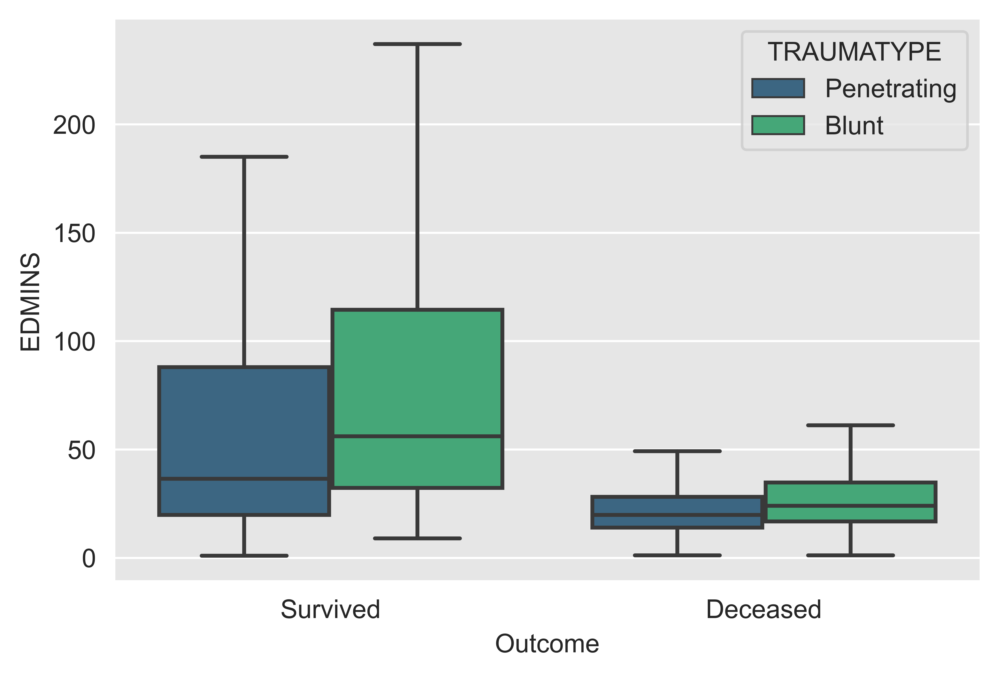

In [19]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='EDMINS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Days in the ED for Survived and Deceased by Trauma Type

> **Main Finding:** Regardless of outcome, the vast majority of patients are out of the ED within the first day to their various placements or the morgue.

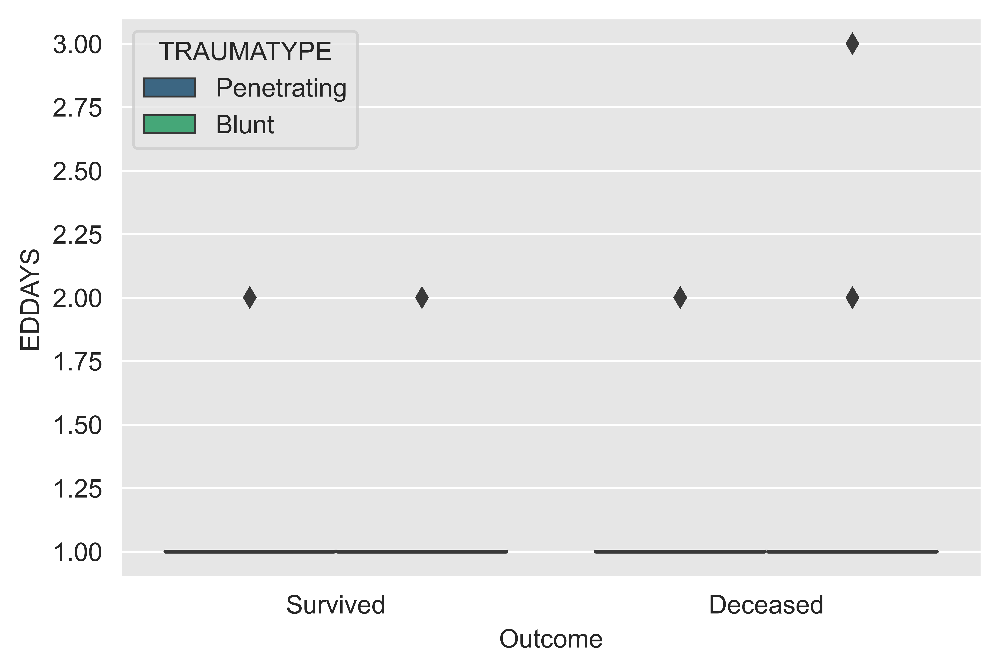

In [20]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='EDDAYS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=True,
               palette='viridis')
plt.show()

# Comparing Minutes over Length of Stay (LOS) for Survived and Deceased by Trauma Type

> **Main Finding:** Those that do NOT survive have a LOS <200 minutes, majority of which do NOT survive beyond the first 30 minutes.
> For those that survive, they spend around 250k minutes in the hospital, longer for blunt than penetrating.

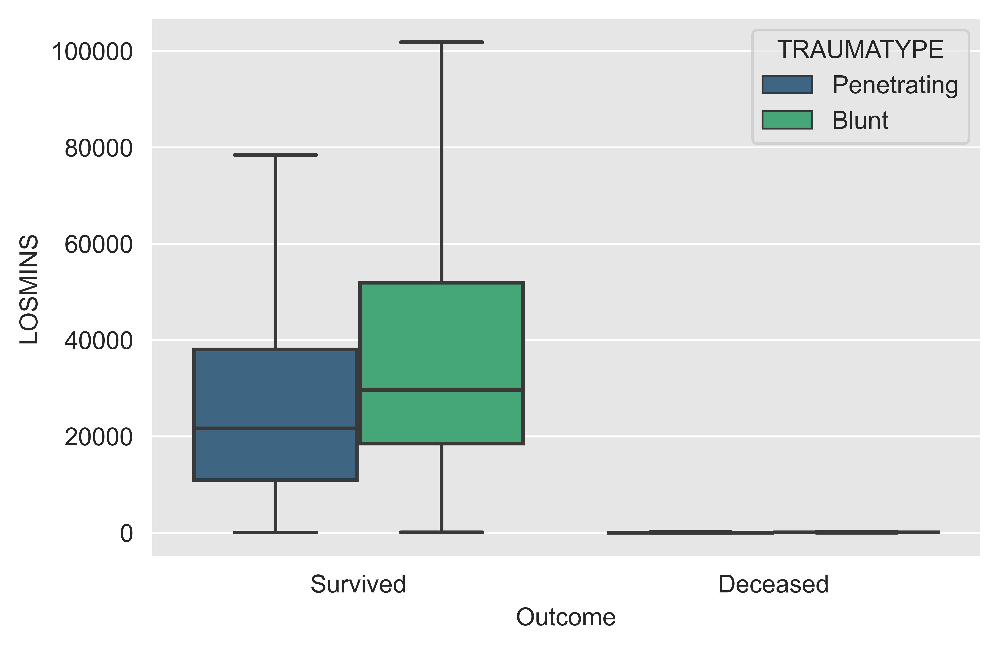

In [21]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='LOSMINS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

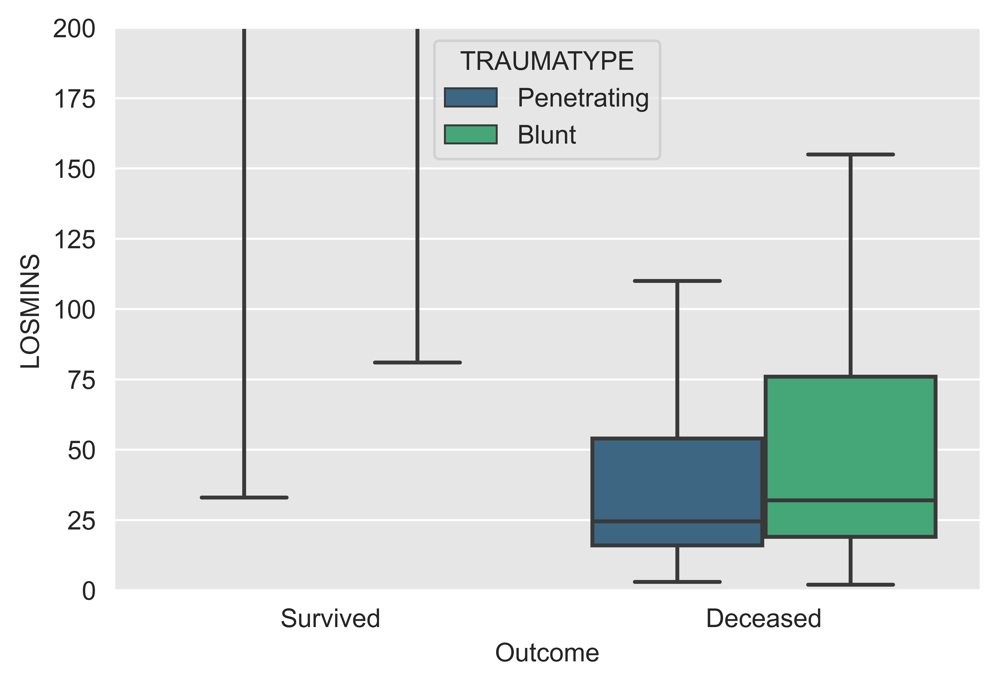

In [22]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='LOSMINS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.ylim(0, 200)
plt.show()

# Comparing Days over Length of Stay (LOS) for Survived and Deceased by Trauma Type

> **Main Finding:** For those that do NOT survive, they obviously do not have a LOS greater than a day, with the exception of a handful of outliers who are likely hanging on in the ICU for sometime but ultimately do not recover.

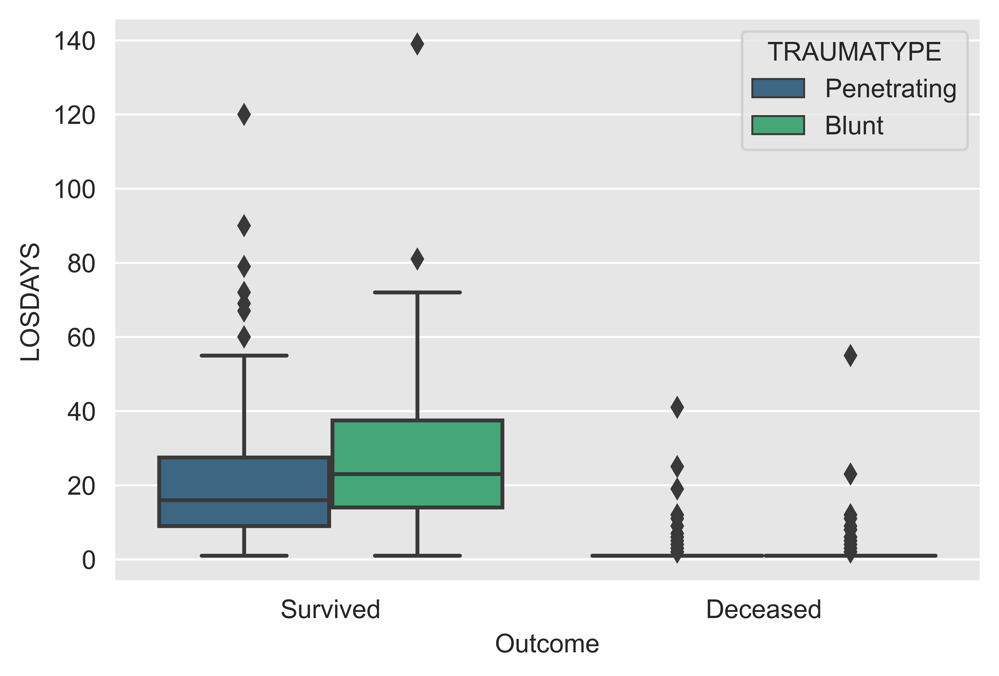

In [23]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='LOSDAYS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=True,
               palette='viridis')
plt.show()

# Comparing Height for Survived and Deceased by Trauma Type

> **Main Finding:** As expected, there is minimal (if any) differences in survival based on height. These ranges cover mainly between 5' and 6'6". There are outliers outside of these height ranges, shorter than 5' likely starting to dip into pediatrics and there are fewer of these cases in general and anyone taller than 6'6" is a substantial outlier. Overall, height does not seem to be correlated with mortality in any appreciable way.

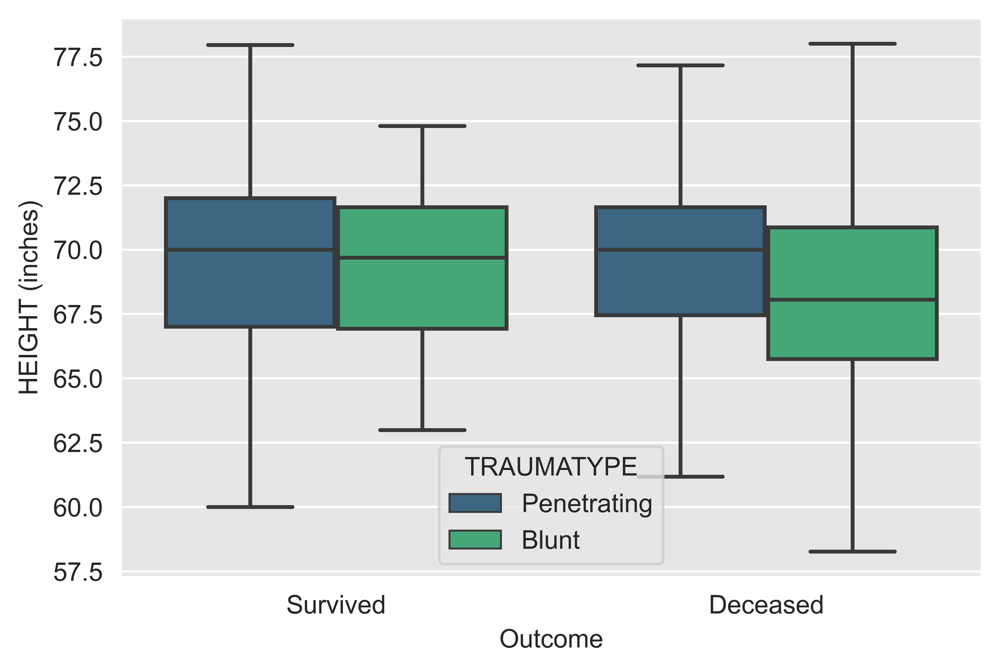

In [25]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='HEIGHT (inches)',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Weight for Survived and Deceased by Trauma Type

> **Main Finding:** There is no difference between the survived vs deceased demographic that is evident as a result of weight as well as trauma type.

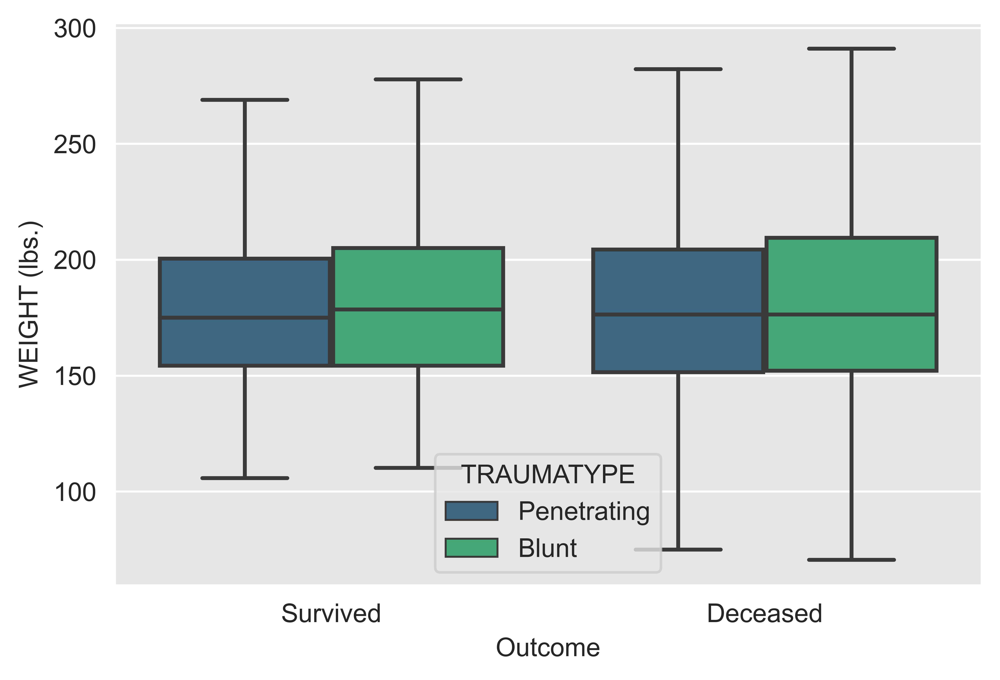

In [10]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='WEIGHT (lbs.)',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

### Comparing BMI for Survived and Deceased by Trauma Type

> **Main Finding:** There are no differences between those that survived vs deceased based on BMI as well as by trauma type. This is not suprising considering there were no substantially significant findings for height and weight either.

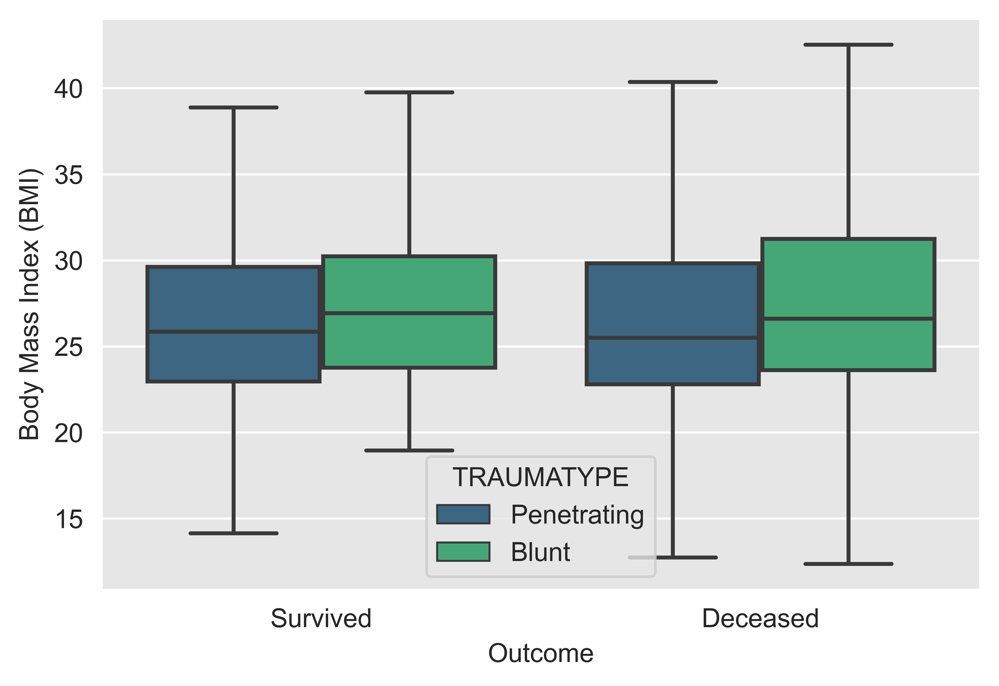

In [27]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='Bmi',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.ylabel('Body Mass Index (BMI)')
plt.show()

# Comparing ICU LOS for Survived and Deceased by Trauma Type

> **Main Finding:** Those who were deceased did not survive past the first 5-6 days of their ICU stay. Those that survived, had longer ICU stays for blunt mechanisms when compared to penetrating injuries. This seems to be the case for deceased patients as well but the overall LOS for the deceased patients is already substantially shorter in general given the severity of their medical state.

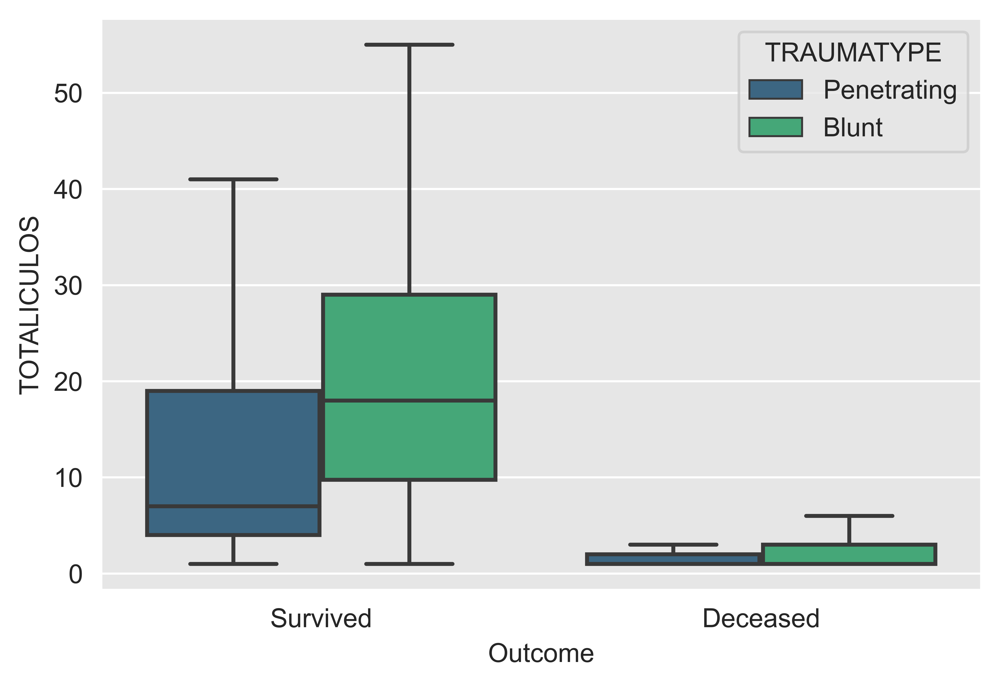

In [28]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='TOTALICULOS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

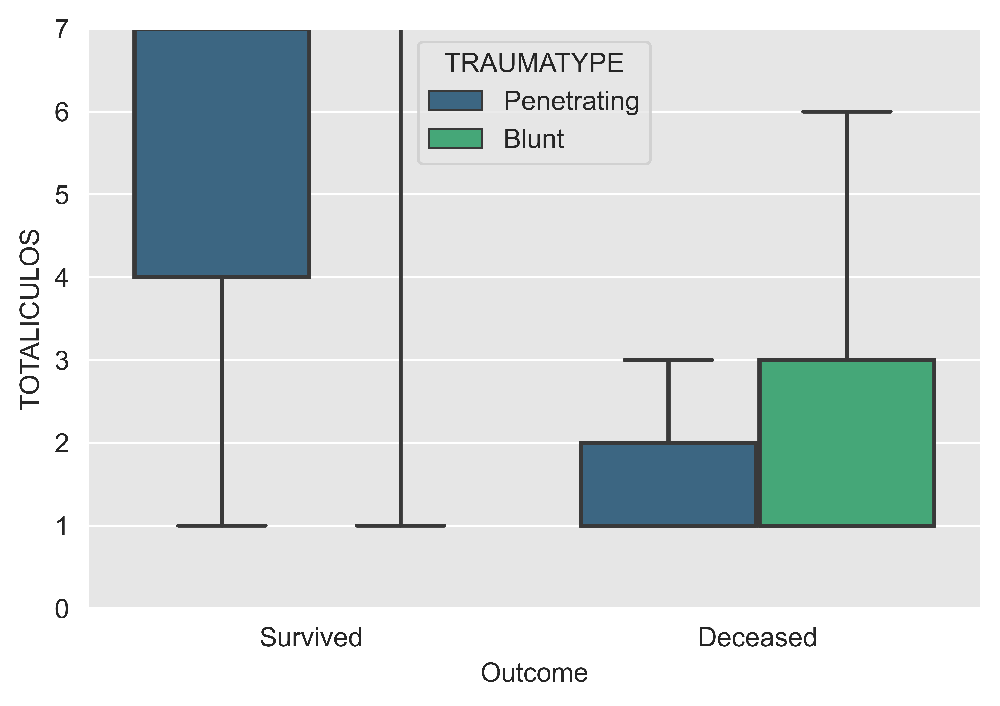

In [29]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='TOTALICULOS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.ylim(0,7)
plt.show()

# Comparing Ventilator Days for Survived and Deceased by Trauma Type

> **Main Finding:** The number of ventilator days (unsuprisingly) closely mirrors the ICU LOS. Again, blunt is longer than penetrating for survivors. It seems ICU LOS is just a few days longer than VENT DAYS but otherwise roughly the same distribution which makes me wonder if there is a specific protocol for number of days you stay in the ICU following being extubated that explains this trend.

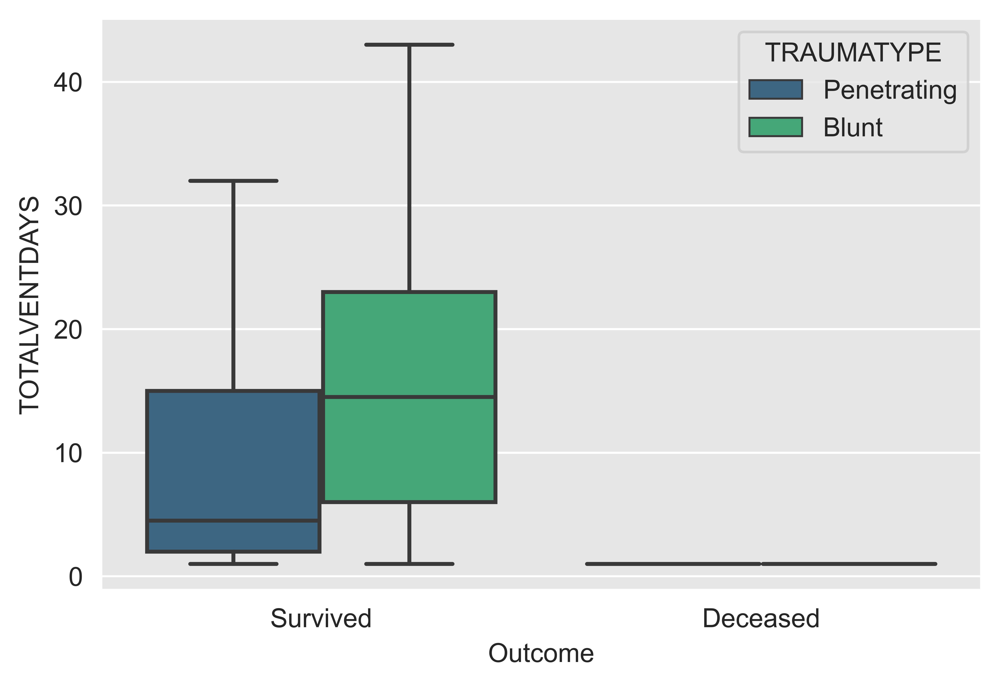

In [8]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='TOTALVENTDAYS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing EMS Reponse Minutes for Survived and Deceased by Trauma Type

> **Main Finding:** There doesn't seem to be a clear difference in the response times and mortality, however, interestingly you could possibly argue that there are *shorter* response times for the deceased group.

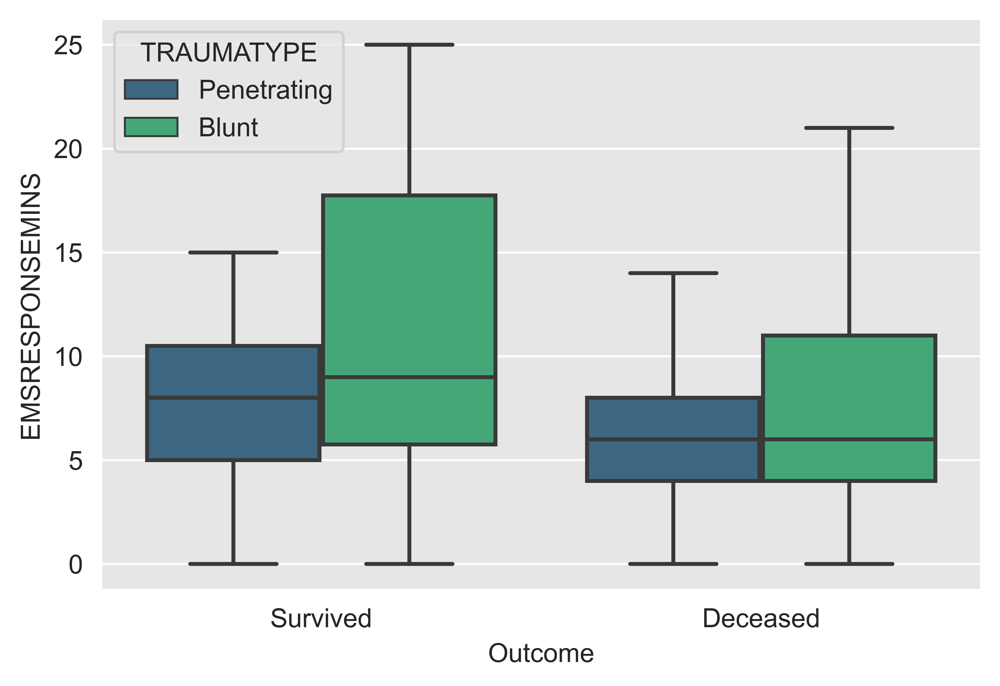

In [31]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='EMSRESPONSEMINS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing EMS Scene Minutes for Survived and Deceased by Trauma Type

> **Main Finding:** There do not appear to be any differences in scene time for the survivor vs deceased group. However, there does seem to be longer EMS scene times in blunt traumas compared to penetrating in both the survivor and deceased groups. This is likely because the MOI may be MVC and require extrication of the patient whereas in penetrating trauma this is not typically a factor involved. Regardless, even when comparing by mechanism, the surviror and deceased groups have almost identical scene times.

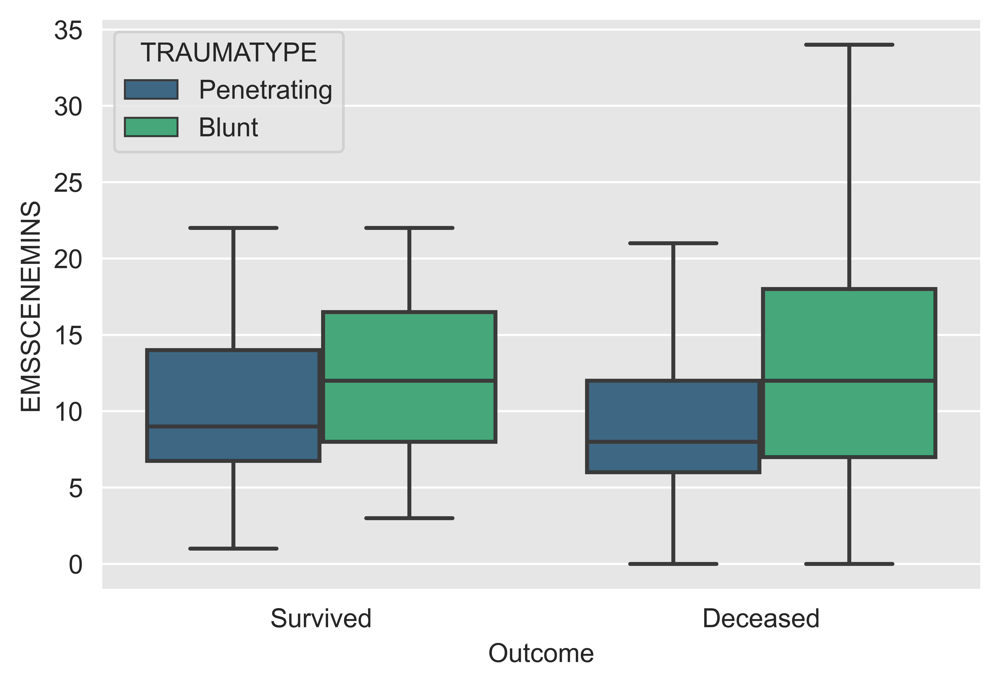

In [32]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='EMSSCENEMINS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Time to Hemorrhage Control Surgery from arrival at the EDD for Survived and Deceased by Trauma Type

> **Main Finding:** If you can survive the first **6-10 minutes** without needing the thoracotomy you have good odds of survival. 

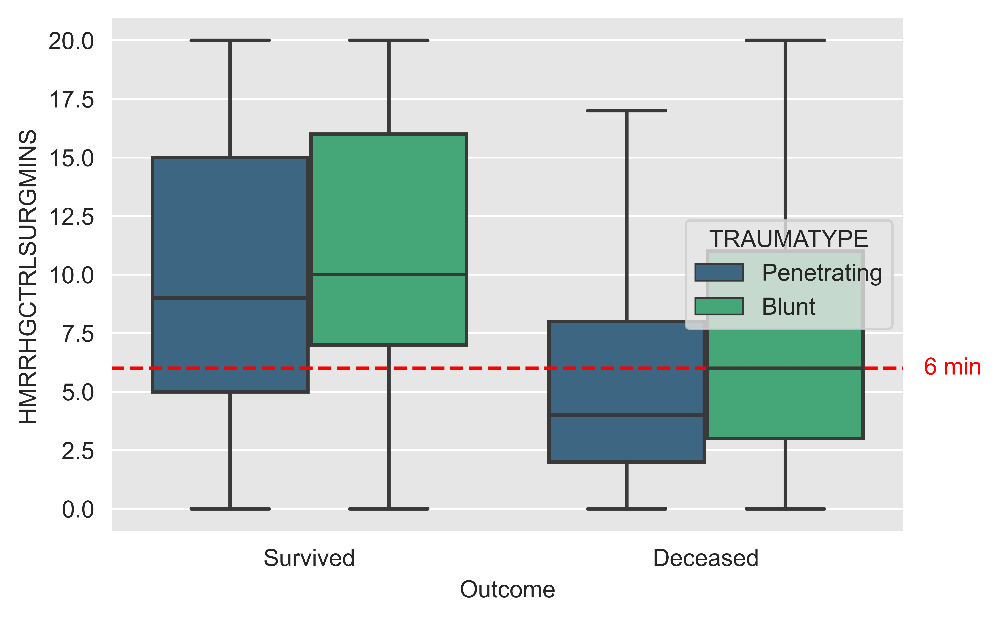

In [33]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='HMRRHGCTRLSURGMINS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 6
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value} min', color='red', va='center')
plt.show()

# Analysis of Blood Products Received

> **Notice:** All patient's blood products that had measured products in units were converted to CC's or mL's

> **Caution:** In order to calculate the CC's of blood product transfused, a conversion value is used for each hospital as what they define as a "Unit" of blood product depends on the hospital. Some of the cases this is not a listed value made available. In order to utilize this data, the median of all of the conversion values for each respective blood product (ignoring Nan values) was calculated and used to fill in the blank for these instances. Median was used in place of mean because it is less sensitive to outliers.

> **Of note:** There are a few instances in which the `median` value decreases between the 4 and 24 hour time stamps, however, I independtly verified that the `mean` for each scenario are not doing this. What is found is that there is just an increase in the number of lower units given at 24 hours than at 4 hours leading to a decreased `median` but since the `mean` is more sensitive to outliers and not just the middlemost value it shows the expected progression from 4 to 24 hours. Boxplots inherently show the median as the line inside of the box which means that in the images below it may appear that from 4 to 24 hours the median is decreasing. An example scenario would include patients who let's say got no units of blood in the first 4 hours but in the subsequent 20 hours received even a single unit of blood. A large number of these smaller transfusions will tank the `median`.

# Comparing Blood Received at 4 hours for Survived and Deceased by Trauma Type

> **Main Finding:** There is roughly a 1L difference, on average, between the survivors and deceased in terms of the volume of blood in the first 4 hours. Time is likely a substantial component to this as there limitations to infusion rates and since the deceased population does not survive for long, this is not suprising. Once the 24 hour plot is made (below), I imagine that there will be not much of a change in the deceased category, but the survived category should increase in the volumne of blood received.

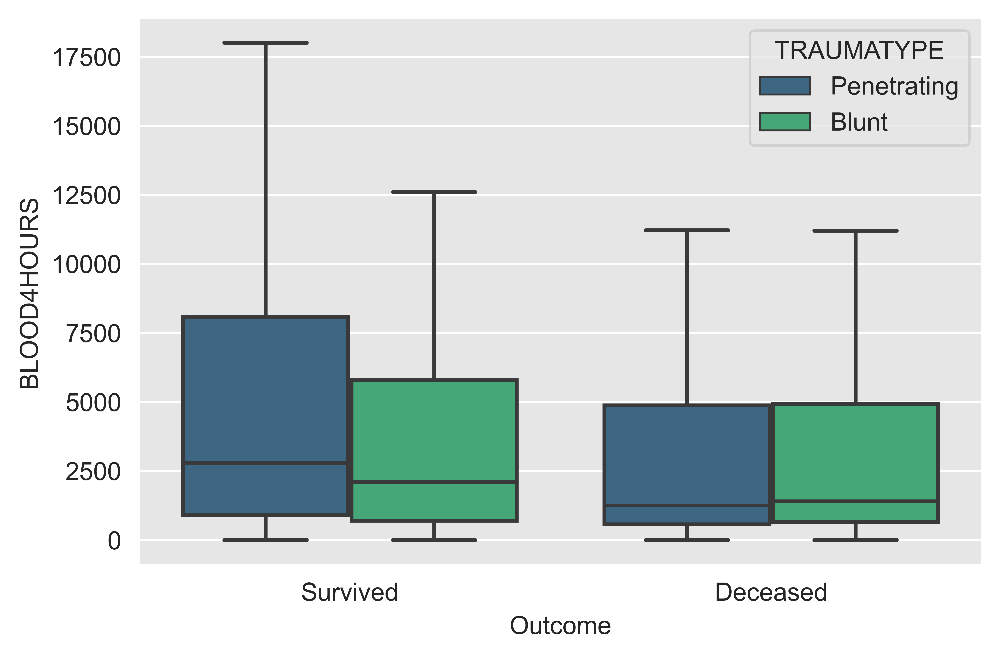

In [34]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='BLOOD4HOURS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Blood Received at 24 hours for Survived and Deceased by Trauma Type

> **Main Finding:** During the first 24 hours there is not a substantial increase in blood given for survivors with penetrating mechanism but for the blunt survivors there is some increase in the amount of blood transfused. For the deceased patients the amount of blood transfused for both trauma types did not change much, penetrating traumas had a slightly higher increase than blunt.

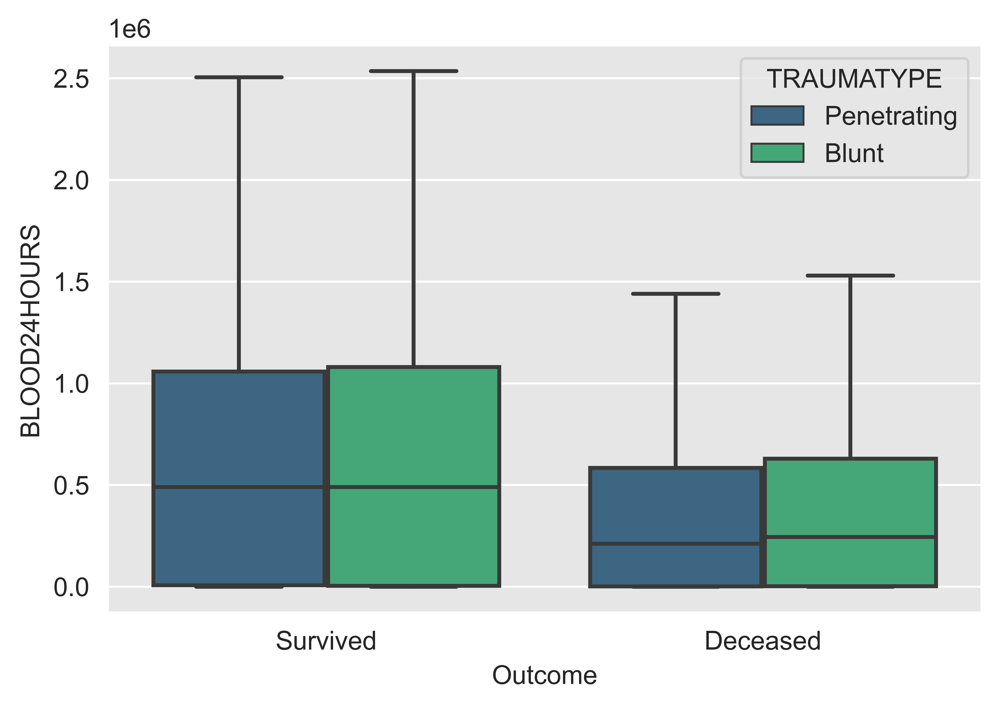

In [35]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='BLOOD24HOURS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Plasma Received at 4 hours for Survived and Deceased by Trauma Type

> **Main Finding:** There was a decent increase in volume of Plasma transfused when comparing survivors to deceased within the first 4 hours.

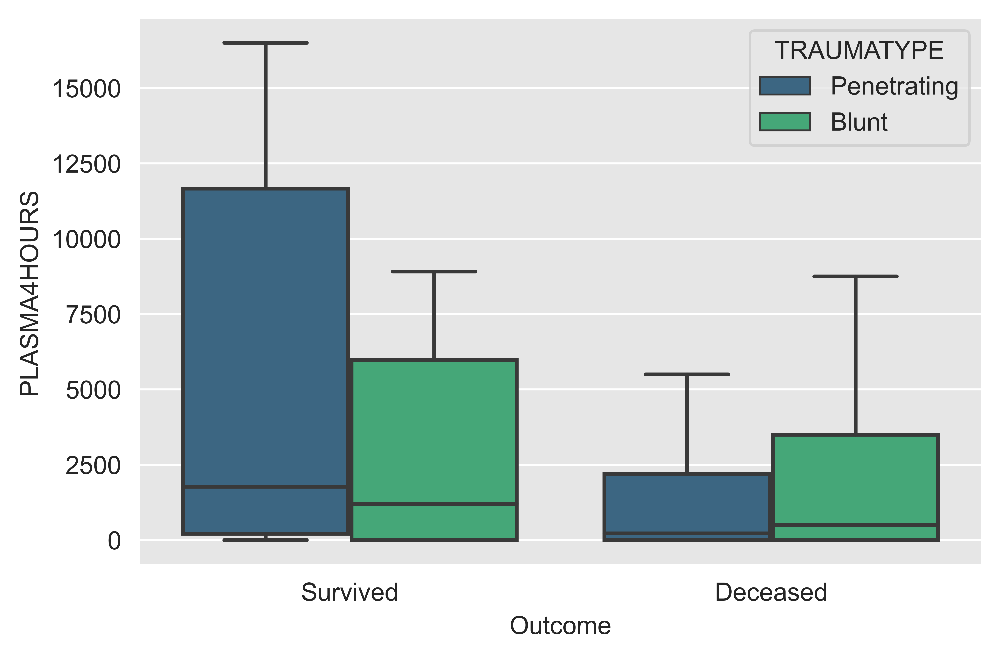

In [36]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='PLASMA4HOURS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Plasma Received at 24 hours for Survived and Deceased by Trauma Type

> **Main Finding:** 

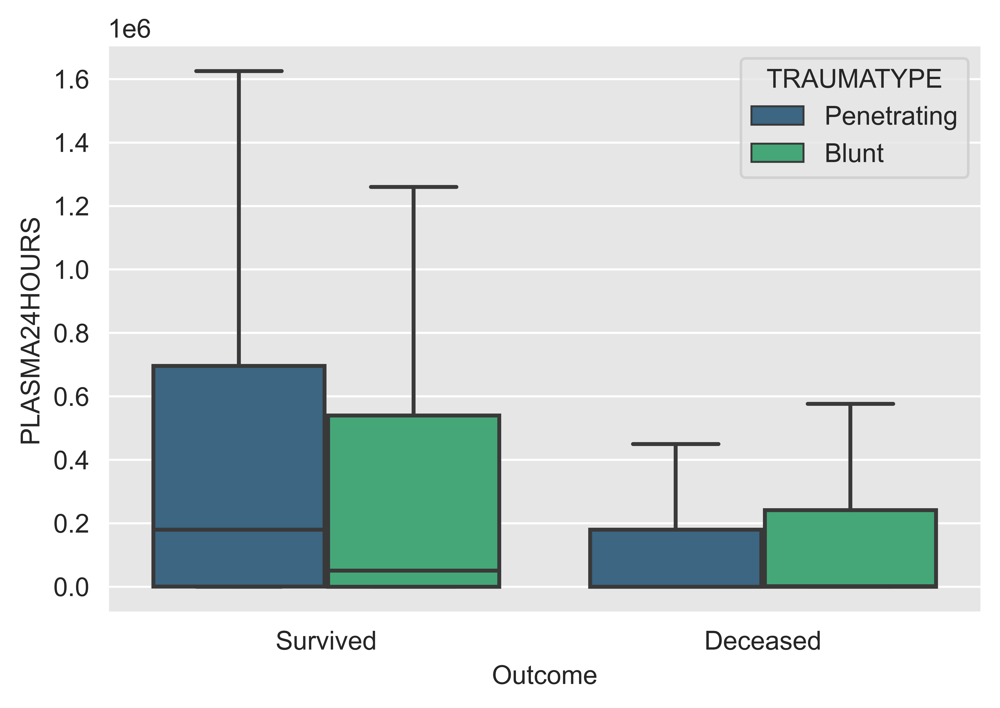

In [37]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='PLASMA24HOURS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Cryoprecipitate Received at 4 hours for Survived and Deceased by Trauma Type

> **Main Finding:** Unsure why but cryoprecipitate is given exclusively to patients with penetrating trauma that survive but not a single deceased patient with penetrating trauma received it.... Why?

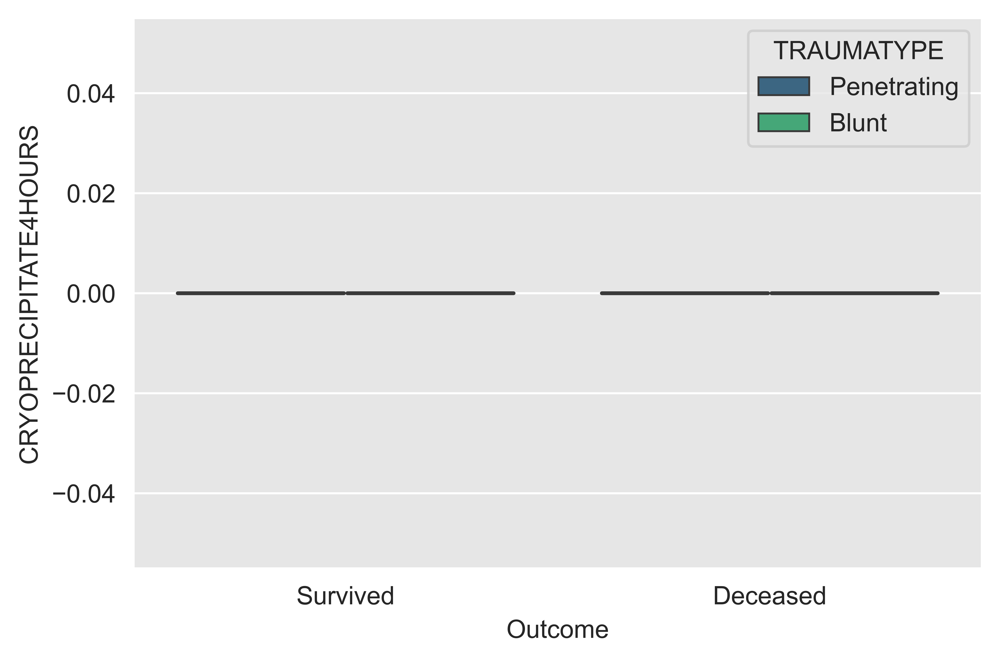

In [38]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='CRYOPRECIPITATE4HOURS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Cryoprecipitate Received at 24 hours for Survived and Deceased by Trauma Type

> **Main Finding:** Blunt for whatever reason starts to get cryoprecipitate within the first 24 hours but not during the first 4 hours. Everyone who was deceased at the 24 hour mark or beyond also received no cryoprecipitate.

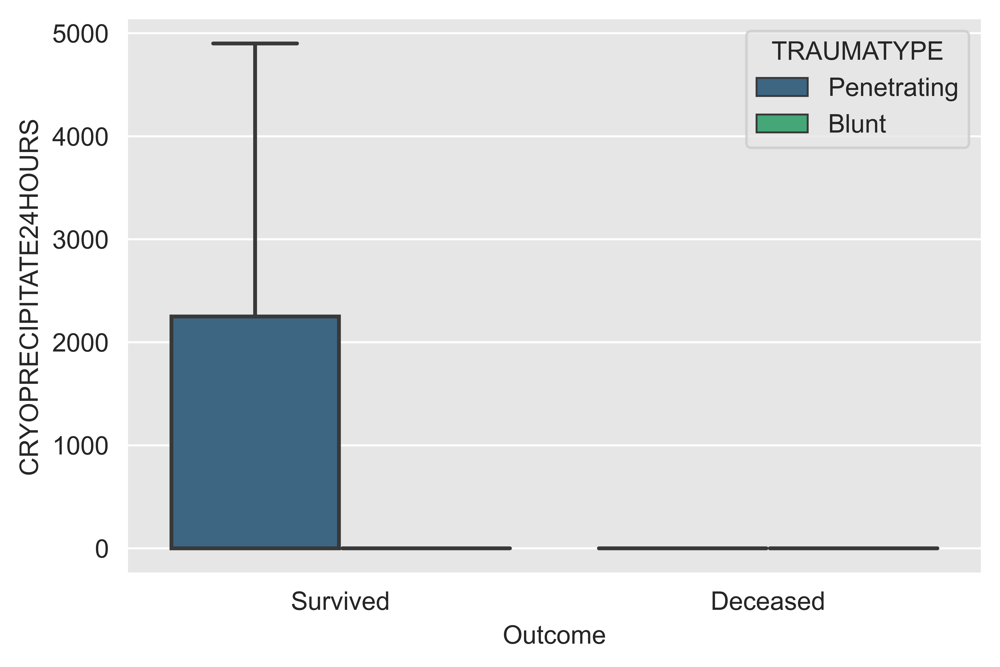

In [39]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='CRYOPRECIPITATE24HOURS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Platelets Received at 4 hours for Survived and Deceased by Trauma Type

> **Main Finding:** Patients that survived received more platelets than patients that were deceased in the first 4 hours.

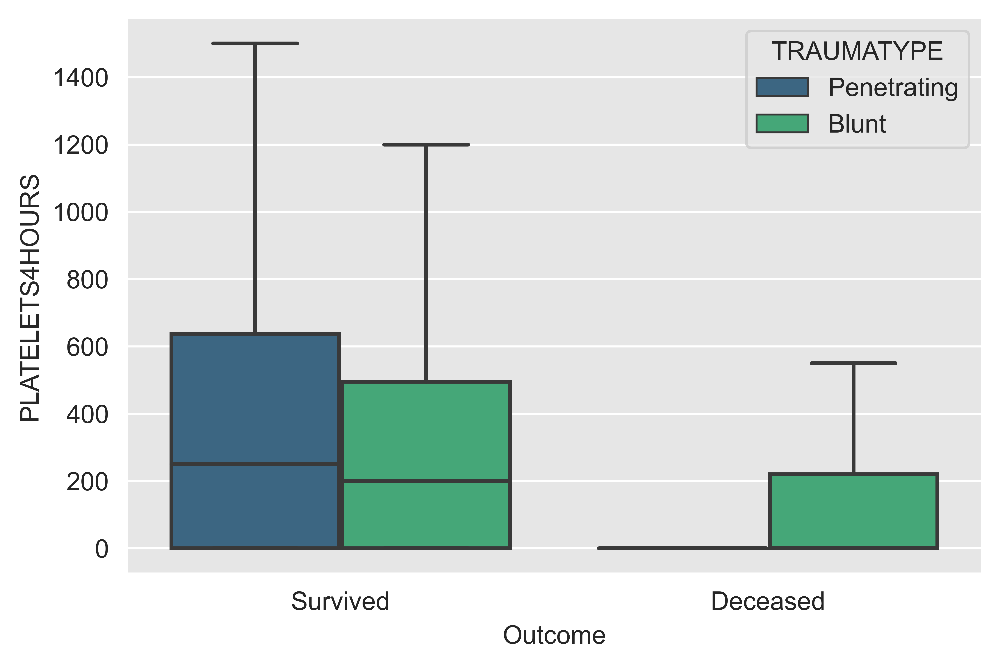

In [40]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='PLATELETS4HOURS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Comparing Platelets Received at 24 hours for Survived and Deceased by Trauma Type

> **Main Finding:** The same trend present at 4 hours is present at 24 hours but there is an overally increase in the deceased cases. Perhaps too little, too late?

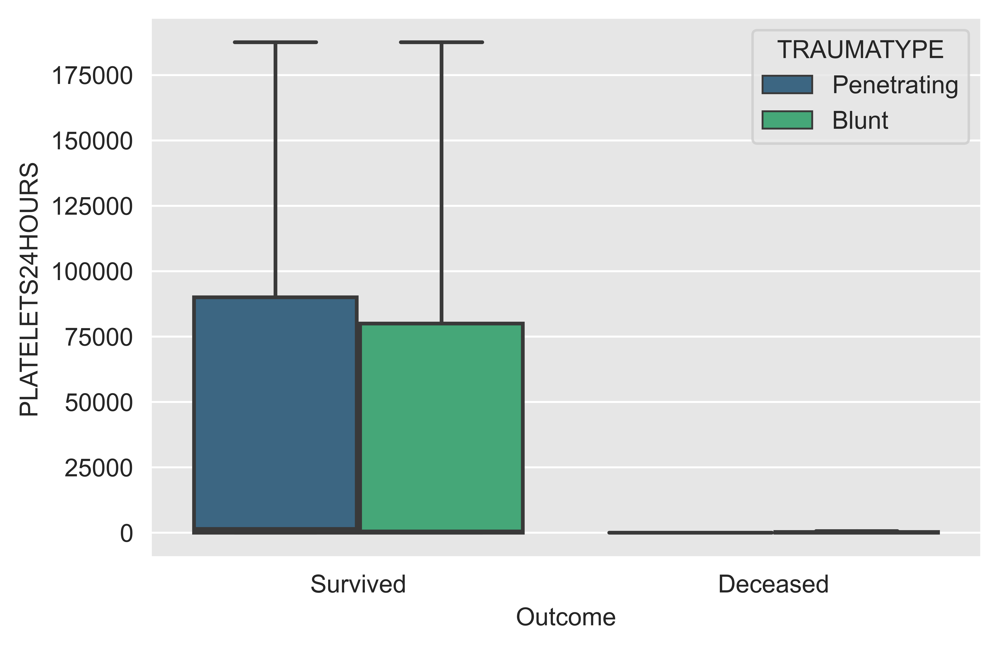

In [41]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='PLATELETS24HOURS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# Analysis of Pre-Hospital and ED Vital Signs

# Comparing Pre-Hospital SBP for Survived and Deceased by Trauma Type

> **Main Finding:** It seems to be, as is well established, that a pre-hospital SBP < 90 mmHg is pretty correlated with mortality and pre-hospital SBP > 90 mmHg is correlated with survival. **However**, it should be noted that there is significant overlap between the survived and deceased patient pre-hospital SBP's.

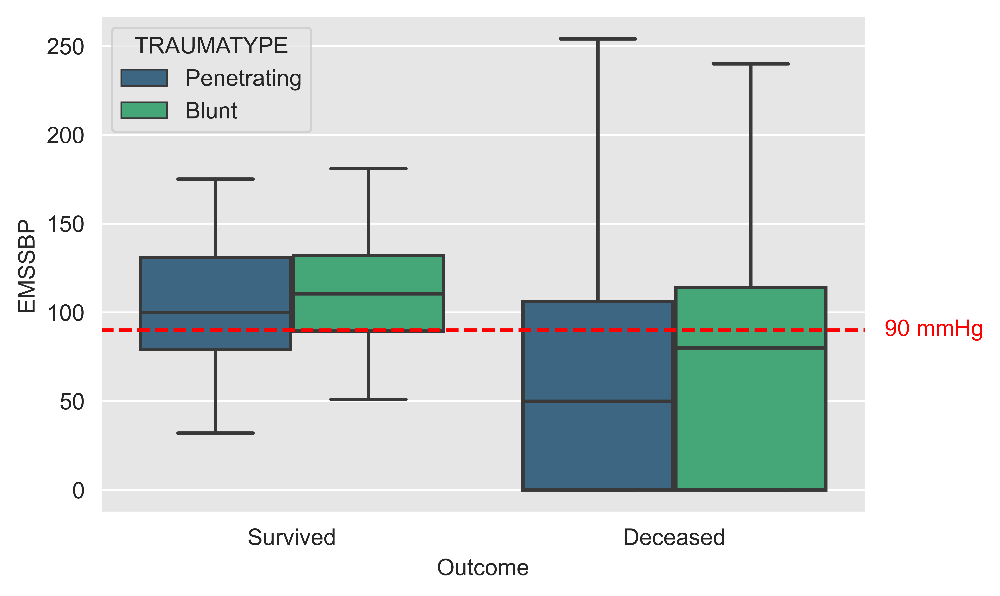

In [42]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='EMSSBP',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 90
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value} mmHg', color='red', va='center')
plt.show()

# Comparing ED SBP for Survived and Deceased by Trauma Type

> **Main Finding:** There is a similar trend to above with initial ED SBP measurements. Lower SBP for the survival group are tolerated for their arrival SBP. For penetrating in the surviving group a wide range of SBP was tolerated, including 0 mmHg. However, this is not the case for blunt. Additionally, penetrating mechanism for the survivor group SBP > 0 mmHg was correlated with positive outcome, whereas in the deceased group (with the exception of outliers), everyone in the penetrating group had a SBP of 0 mmHg. For the blunt deceased group, there are much higher range of SBP indicating that despite SBP on arrival, these patients are still highly critical.

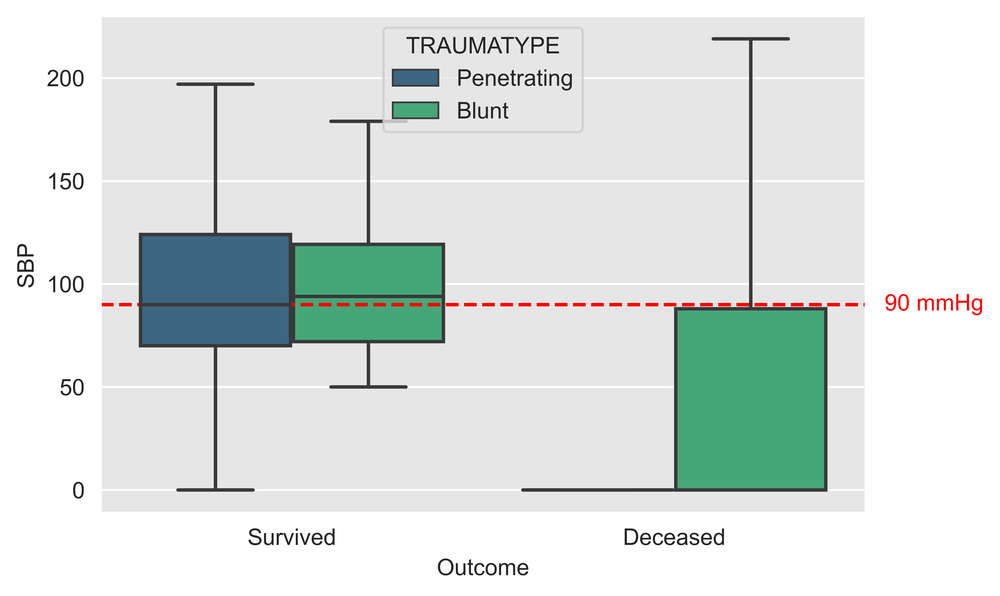

In [43]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='SBP',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 90
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value} mmHg', color='red', va='center')
plt.show()

# Comparing ED Temperature for Survived and Deceased by Trauma Type

> **Main Finding:**

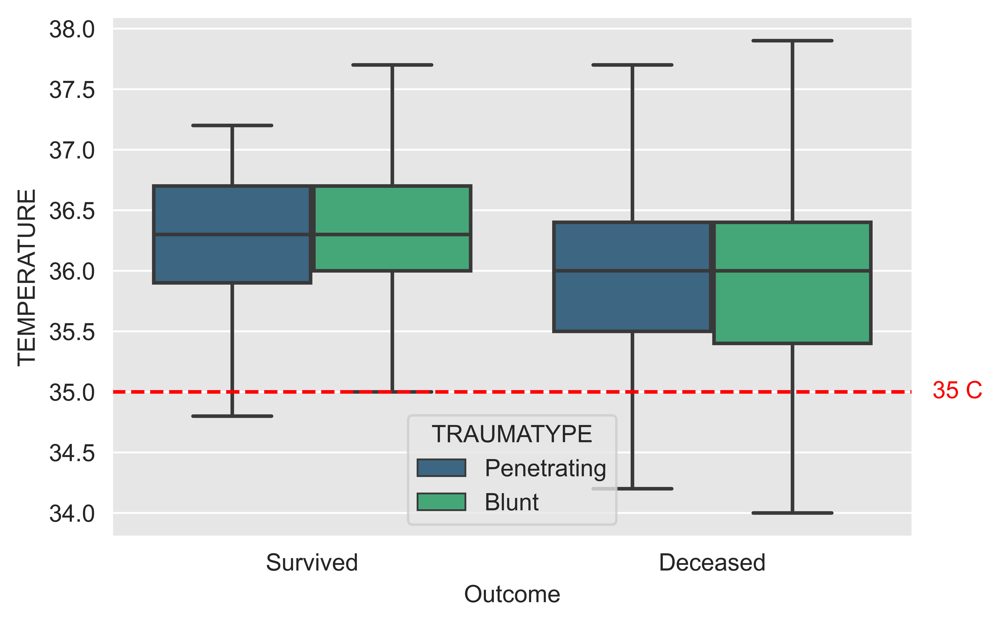

In [44]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='TEMPERATURE',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 35
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value} C', color='red', va='center')
plt.show()

# Comparing Lowest SBP for Survived and Deceased by Trauma Type

> These measurements occur within the first **1 hour** of arrival at the ED.

> **Main Finding:**

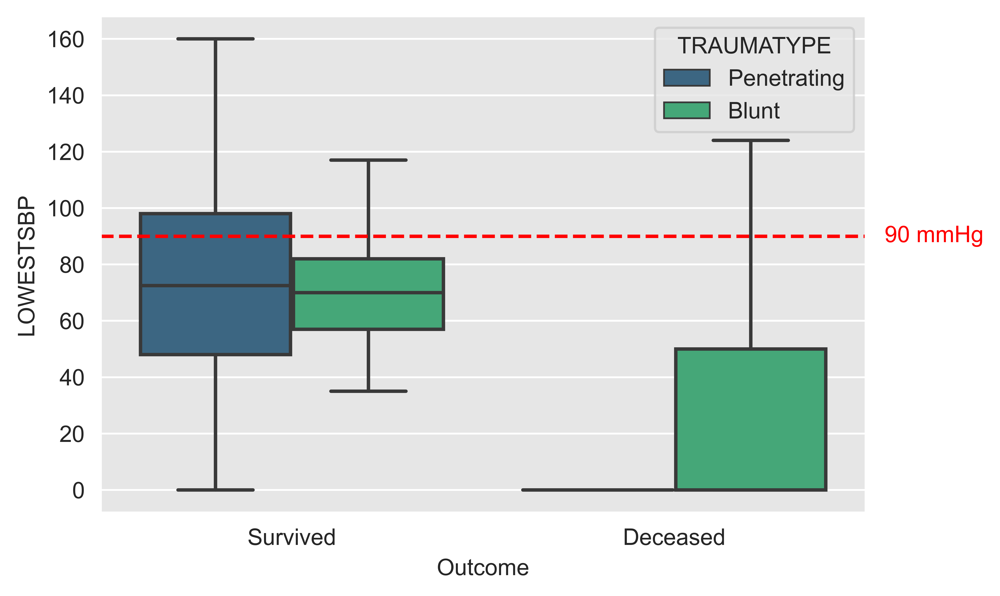

In [45]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='LOWESTSBP',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 90
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value} mmHg', color='red', va='center')
plt.show()

# Comparing Pre-Hospital Pulse Rate for Survived and Deceased by Trauma Type

> **Main Finding:** 

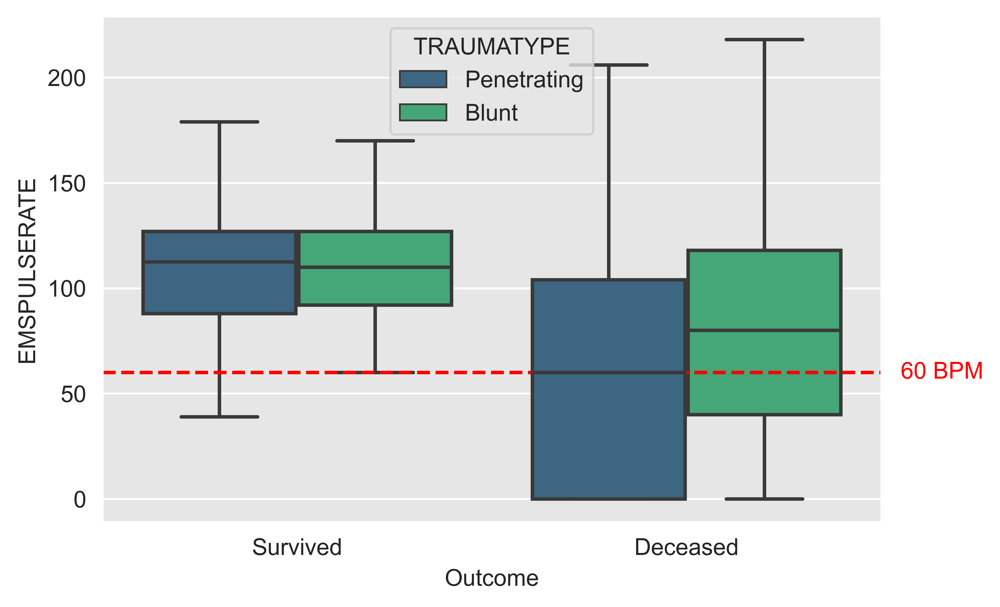

In [46]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='EMSPULSERATE',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 60
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value} BPM', color='red', va='center')
plt.show()

# Comparing ED Pulse Rate for Survived and Deceased by Trauma Type

> **Main Finding:** 

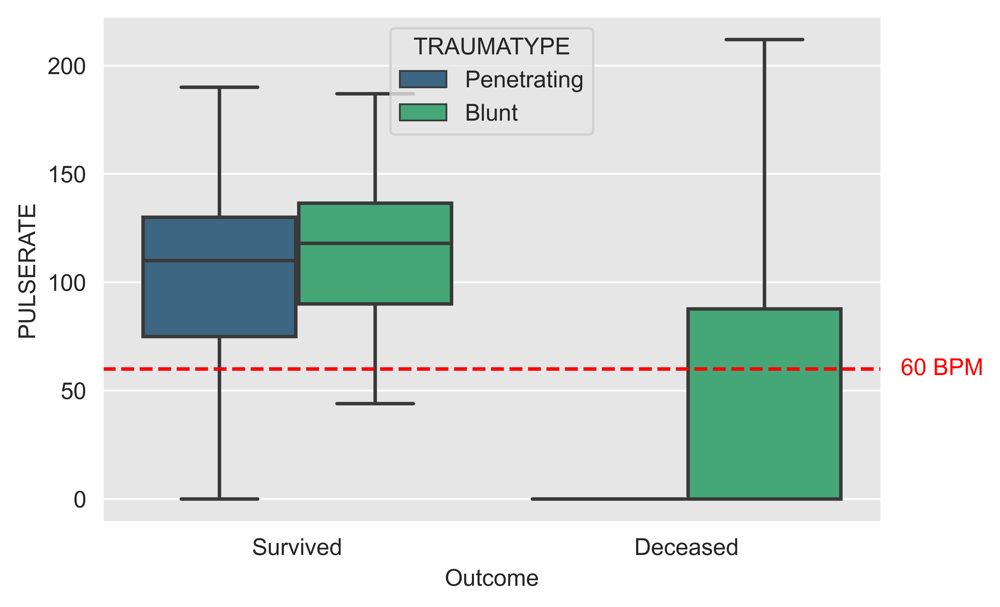

In [47]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='PULSERATE',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 60
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value} BPM', color='red', va='center')
plt.show()

# Comparing Pre-Hospital Respiratory Rate for Survived and Deceased by Trauma Type

> **Main Finding:** 

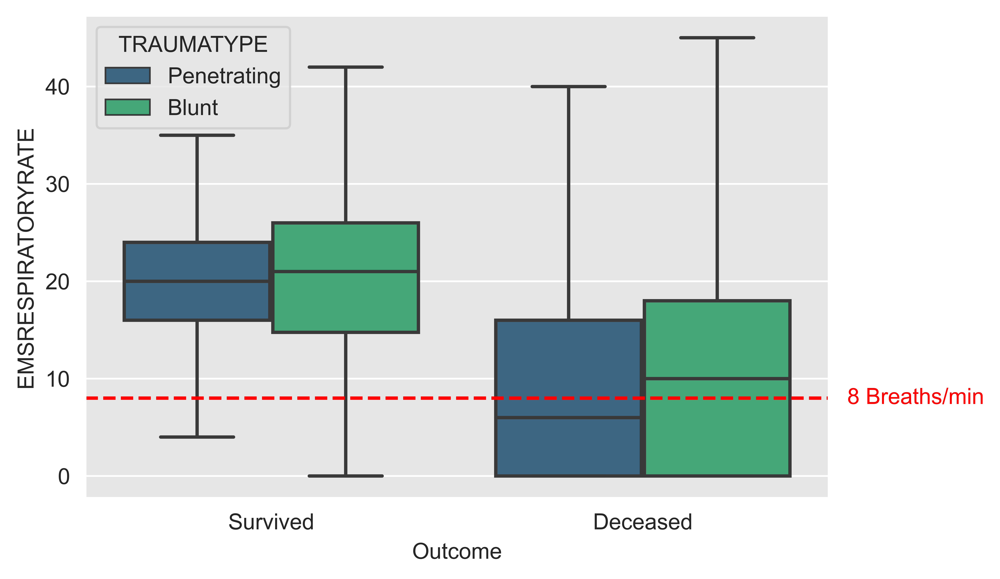

In [48]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='EMSRESPIRATORYRATE',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 8
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value} Breaths/min', color='red', va='center')
plt.show()

# Comparing ED Respiratory Rate for Survived and Deceased by Trauma Type

> **Main Finding:** 

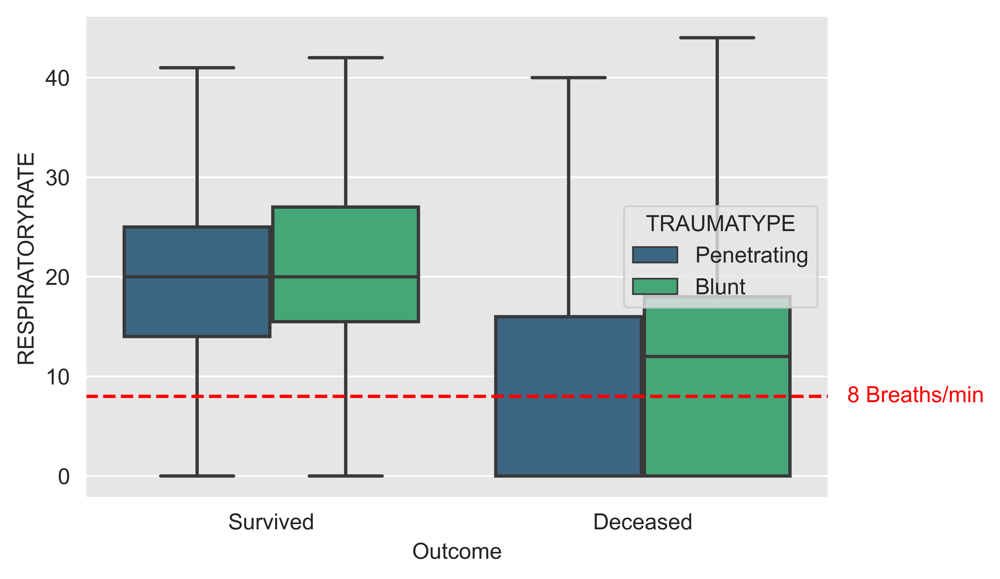

In [49]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='RESPIRATORYRATE',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 8
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value} Breaths/min', color='red', va='center')
plt.show()

# Comparing Pre-Hospital Total GCS for Survived and Deceased by Trauma Type

> **Main Finding:** 

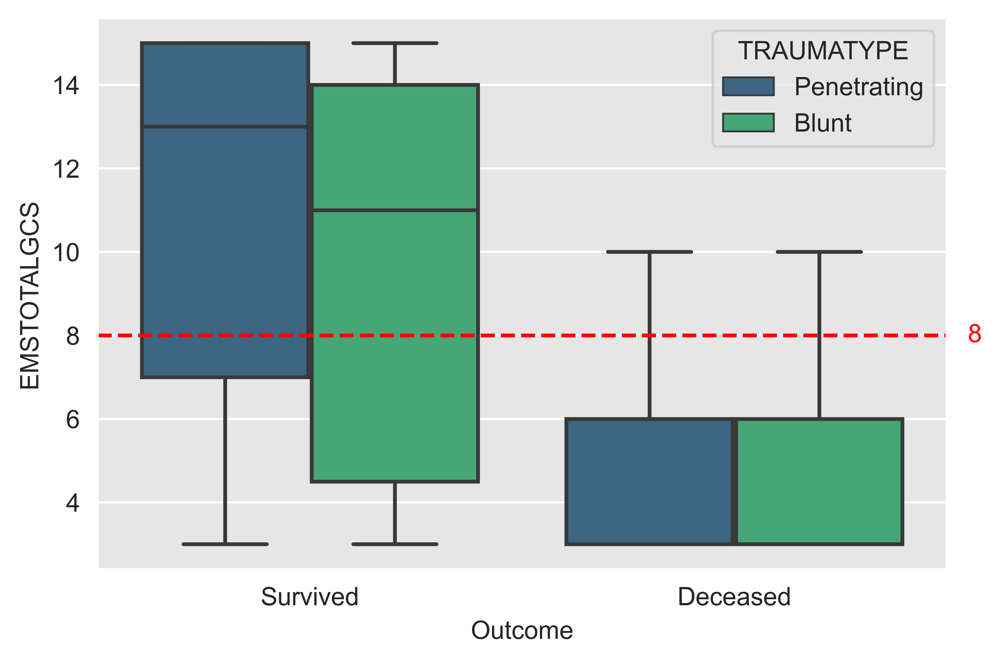

In [50]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='EMSTOTALGCS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 8
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value}', color='red', va='center')
plt.show()

# Comparing ED Total GCS for Survived and Deceased by Trauma Type

> **Main Finding:** 

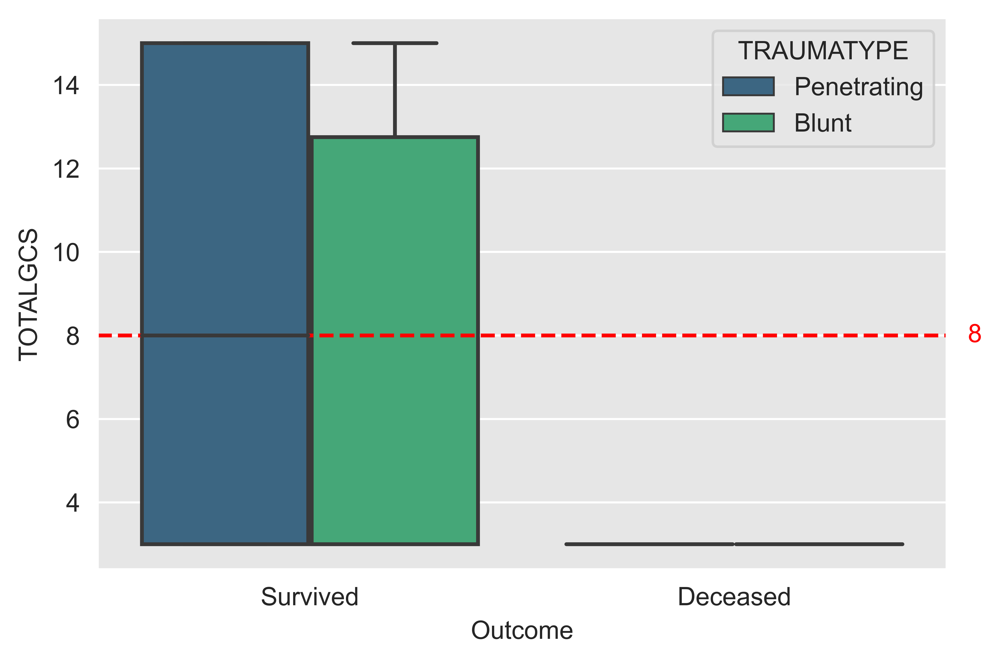

In [51]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='TOTALGCS',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 8
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value}', color='red', va='center')
plt.show()

# Comparing Pre-Hospital Pulse Oximetry for Survived and Deceased by Trauma Type

> **Main Finding:** 

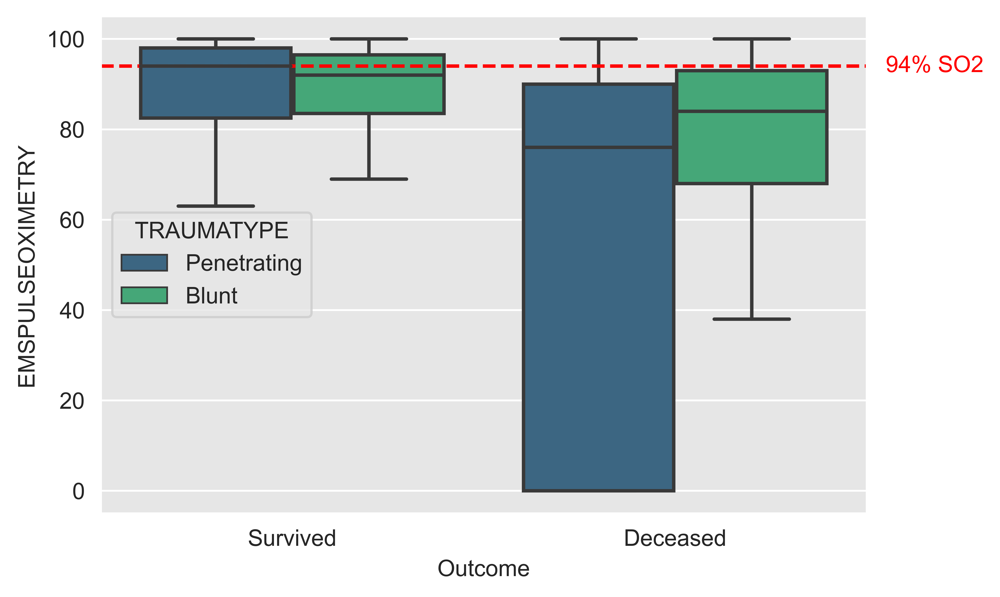

In [52]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='EMSPULSEOXIMETRY',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 94
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value}% SO2', color='red', va='center')
plt.show()

# Comparing ED Pulse Oximetry for Survived and Deceased by Trauma Type

> **Main Finding:** 

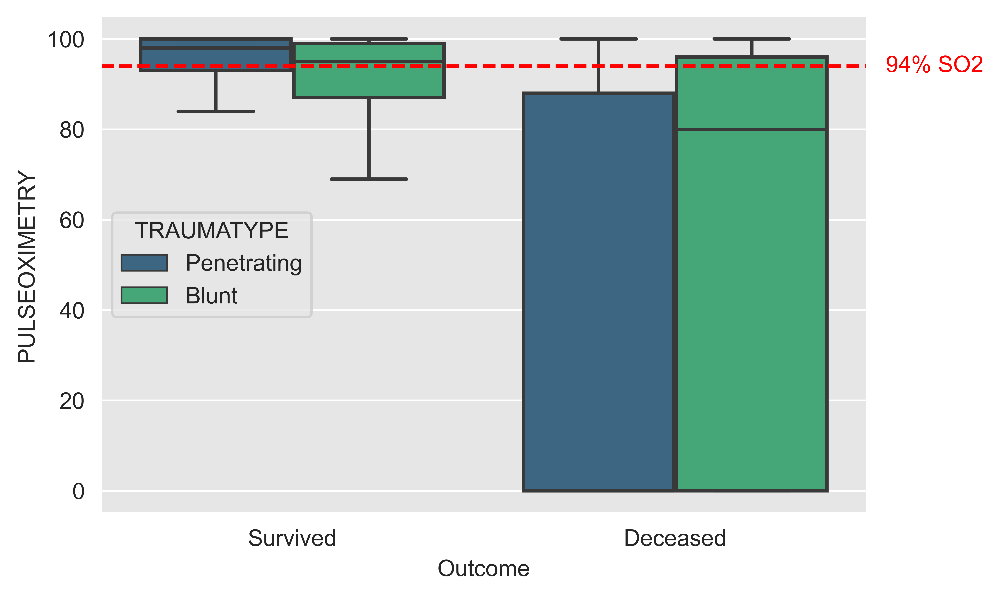

In [53]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='PULSEOXIMETRY',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
y_value = 94
plt.axhline(y=y_value, color='red', linestyle='--')
plt.text(len(OUTCOMES_df['Outcome'].unique()) - 0.45, y_value, f'{y_value}% SO2', color='red', va='center')
plt.show()

# Analysis of Comorbid Conditions, Drug Screens and Hospital Complications

# Comparing Number of Comorbid Conditions for Survived and Deceased by Trauma Type

> **Main Finding:** 

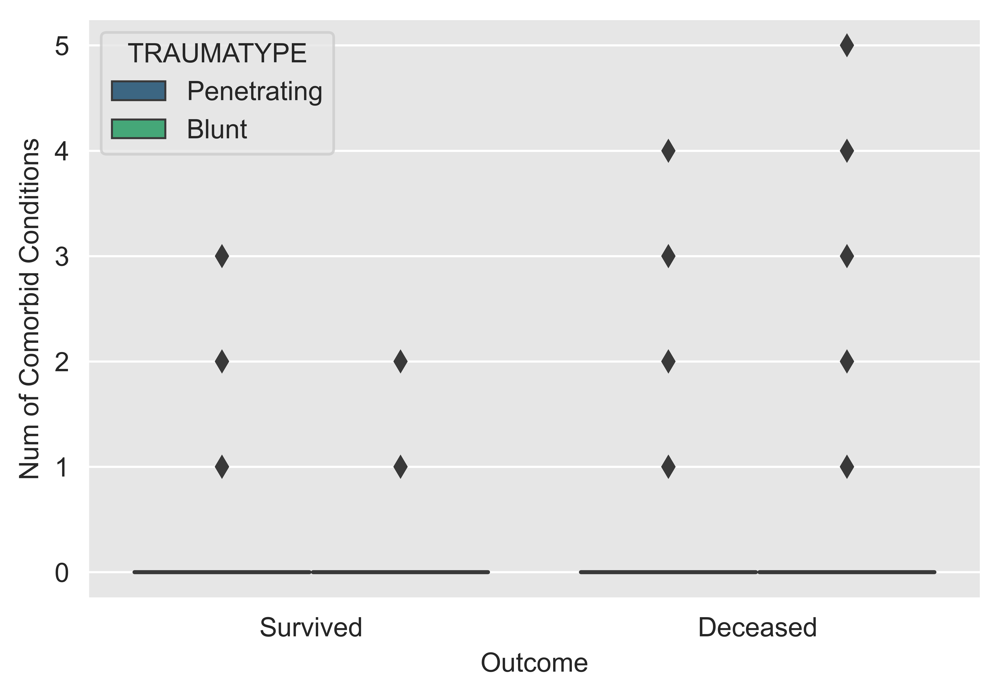

In [54]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='Num of Comorbid Conditions',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=True,
               palette='viridis')
plt.show()

# Comparing Number of Hospital Complications for Survived and Deceased by Trauma Type

> **Main Finding:** 

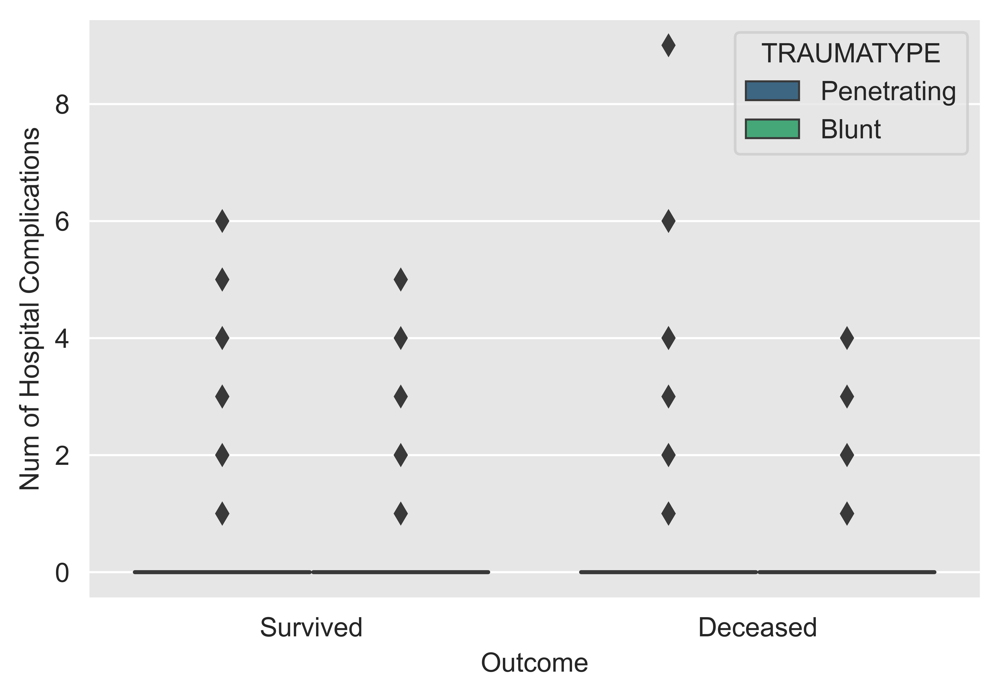

In [55]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='Num of Hospital Complications',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=True,
               palette='viridis')
plt.show()

# Comparing Number of Drugs/ Toxicology for Survived and Deceased by Trauma Type

> **Main Finding:** 

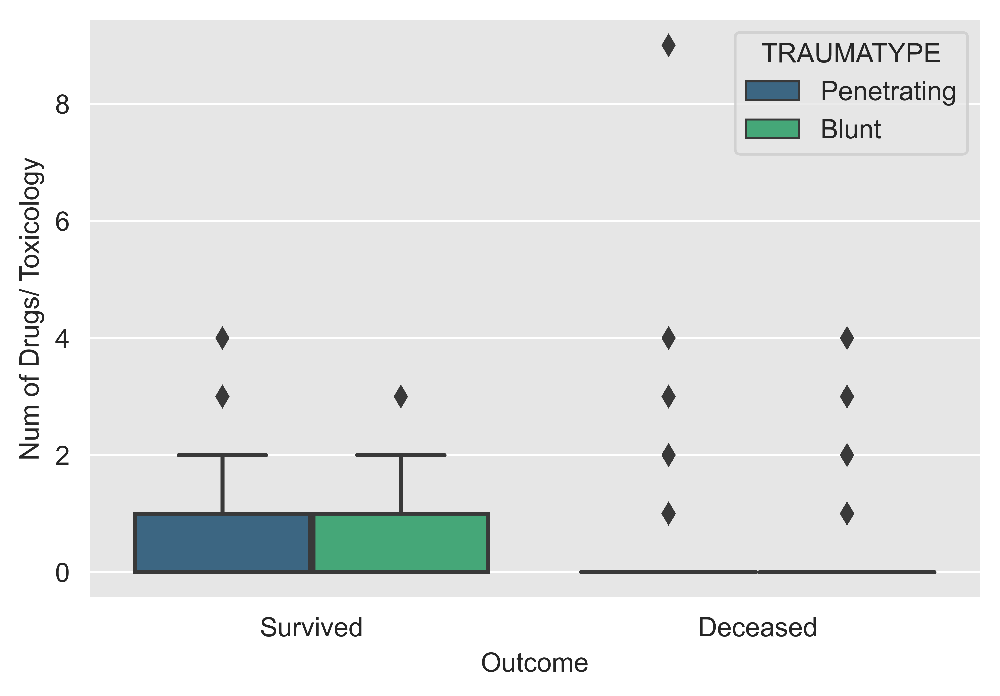

In [56]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='Num of Drugs/ Toxicology',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=True,
               palette='viridis')
plt.show()

# Comparing Alcohol Screen Result for Survived and Deceased by Trauma Type

> **Main Finding:** 

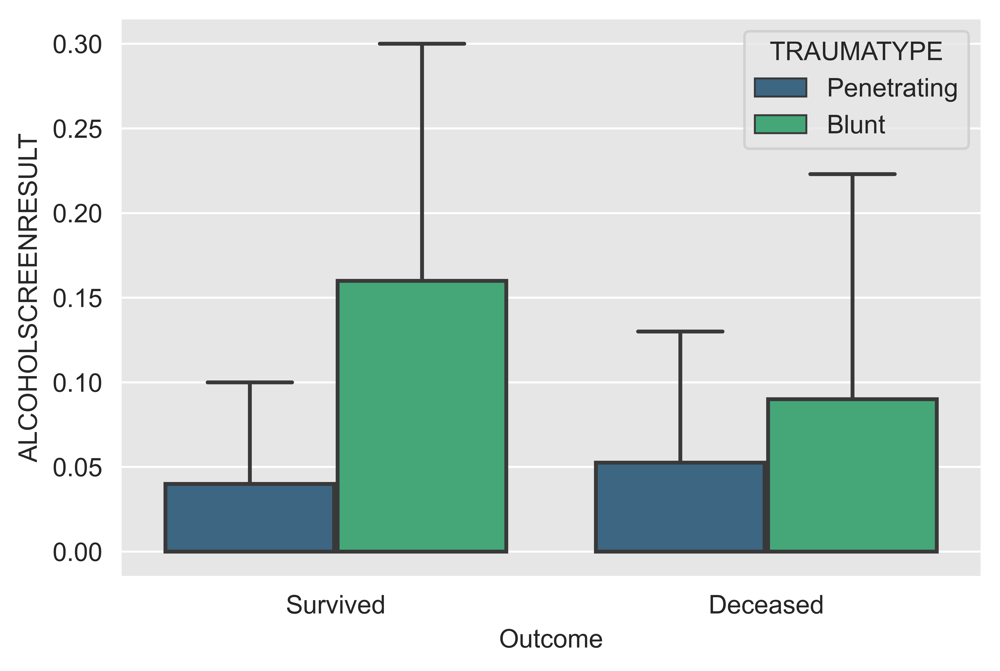

In [57]:
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)

g = sns.boxplot(data=OUTCOMES_df,
               y='ALCOHOLSCREENRESULT',
               x='Outcome',
               hue='TRAUMATYPE',
               showfliers=False,
               palette='viridis')
plt.show()

# As requested by Zoe, which drugs to do to increase outcomes
> Currently only include 2017-2018 data, need to add the old data but have to reconfigure.

In [58]:
# Extract columns starting with 'DRGSCR_'
drug_columns = [col for col in TRAUMA_all_df.columns if col.startswith('DRGSCR_')]

# Group by 'Outcome' and sum the values
drug_sums = TRAUMA_all_df.groupby('Outcome')[drug_columns].sum().reset_index()

# Multiply sums for 'Deceased' by -1
drug_sums.loc[drug_sums['Outcome'] == 'Deceased', drug_columns] *= -1

# Melt the DataFrame for easier plotting
melted_drug_sums = drug_sums.melt(id_vars='Outcome', var_name='Drug', value_name='Sum')

# Remove 'DRGSCR_' prefix from the 'Drug' column
melted_drug_sums['Drug'] = melted_drug_sums['Drug'].str.replace('DRGSCR_', '')

# Create a barplot
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plt.figure(figsize=(12, 8))
sns.barplot(data=melted_drug_sums, x='Drug', y='Sum', hue='Outcome', palette='viridis')
plt.xticks(rotation=90)
plt.title('Sum of Drug Screenings by Outcome')
plt.xlabel('Drug')
plt.ylabel('Sum')
plt.show()


# Naturally this spurred more graphs
> Need to add the 2017-2018 data

In [59]:
# Extract columns starting with 'CC_'
cc_columns = [col for col in TRAUMA_all_df.columns if col.startswith('CC_')]

# Group by 'Outcome' and sum the values
cc_sums = TRAUMA_all_df.groupby('Outcome')[cc_columns].sum().reset_index()

# Multiply sums for 'Deceased' by -1
cc_sums.loc[cc_sums['Outcome'] == 'Deceased', cc_columns] *= -1

# Melt the DataFrame for easier plotting
melted_cc_sums = cc_sums.melt(id_vars='Outcome', var_name='Comorbid Condition', value_name='Sum')

# Remove 'CC_' prefix from the 'Drug' column
melted_cc_sums['Comorbid Condition'] = melted_cc_sums['Comorbid Condition'].str.replace('CC_', '')

# Create a barplot
mpl.rcParams['figure.dpi'] = 1000
sns.set_style('darkgrid', {"axes.facecolor": ".9"})
sns.color_palette("viridis", as_cmap=True)
plt.figure(figsize=(12, 8))
sns.barplot(data=melted_cc_sums, x='Comorbid Condition', y='Sum', hue='Outcome', palette='viridis')
plt.xticks(rotation=90)
plt.title('Sum of Comorbid Conditions by Outcome')
plt.xlabel('Comorbid Condition')
plt.ylabel('Sum')
plt.show()